<a class="anchor" id="second-bullet">

# 1. Data Integration

## 1.1  Import Libraries <a class="anchor" id="2.1"></a>

In [1]:
# Necessary installations

#!pip install squarify
#!pip install seaborn
#!pip install matplotlib
#!pip install numpy
#!pip install pandas
#!pip install scikit-learn
#!pip install scipy


# Necessary imports

# hiding the warnings
import warnings

warnings.filterwarnings('ignore')
import os, sys

sys.stderr = open(os.devnull, "w")  # silence stderr
sys.stderr = sys.__stderr__  # unsilence stderr

import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import squarify

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA

%matplotlib inline

# for better resolution plots
%config InlineBackend.figure_format = 'retina'

# hierarchical clustering
from sklearn.cluster import AgglomerativeClustering, KMeans, MeanShift, DBSCAN, estimate_bandwidth
from scipy.cluster.hierarchy import dendrogram
from sklearn.base import clone
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import pairwise_distances, silhouette_score
from sklearn.mixture import GaussianMixture

from minisom import MiniSom

from matplotlib.patches import RegularPolygon, Ellipse
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import cm, colorbar
from matplotlib import colors as mpl_colors
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colorbar import Colorbar

# setting the style of seaborn
sns.set(rc={'figure.figsize':(11.7,8.27)})

## 1.2 Import Data <a class="anchor" id="2.2"></a>

In [2]:
# Importing the dataset
final_df_ohc = pd.read_csv('DM2425_ABCDEats_DATASET_Preprocessed.csv', index_col="customer_id")

## 1.3. Check data integrity

In [3]:
print(f"NaN Count: {final_df_ohc.isna().sum().sum()}")
print(f"Infinite Count: {final_df_ohc.isin([np.inf, -np.inf]).sum().sum()}")

final_df_ohc.head()

NaN Count: 0
Infinite Count: 0


,Week_days_mean,Weekend_days_mean,HR_peak,DOW_Peak,customer_age,CUI_American,CUI_Italian,CUI_Asian,CUI_OTHER,Chain_Preference,Order_Frequency,Avg_Spend_per_Order,Product_per_Order,Total_Orders,Customer_Duration,Recency,Frequency,Monetary
customer_id,,,,,,,,,,,,,,,,,,
1b8f824d5e,-0.444861,-0.430645,1.208156,-1.320239,-1.446986,-0.456645,-0.31183,0.504971,-0.600861,-0.332317,1.560249,0.540066,2.920203,-0.507104,-1.169091,1,2,28.88
5d272b9dcb,-0.444861,-0.430645,-0.286086,-1.320239,-1.605708,0.820482,-0.31183,-0.415749,-0.600861,0.959062,1.560249,-0.080420,-0.714576,-0.507104,-1.169091,1,2,19.21
f6d1b2ba63,-0.444861,-0.430645,-0.472866,-1.320239,1.727454,0.459858,-0.31183,-0.677350,-0.600861,0.959062,1.560249,-0.722722,-0.714576,-0.507104,-1.169091,1,2,9.20
180c632ed8,-0.444861,-0.430645,-0.099305,-0.825866,-0.177210,-0.456645,-0.31183,0.614688,-0.600861,-0.332317,0.756958,0.712031,0.497017,-0.507104,-1.134782,2,2,31.56
4eb37a6705,-0.444861,-0.430645,-0.659646,-0.825866,-1.129542,0.994817,-0.31183,0.995830,-0.600861,-1.623697,0.756958,2.244317,2.920203,-0.507104,-1.134782,2,2,55.44


## 1.4. Creating perspectives

In [4]:
df_BEHAV = final_df_ohc[['CUI_American', 'CUI_Italian', 'CUI_Asian', 'CUI_OTHER',
       'Chain_Preference', 'Order_Frequency', 'Avg_Spend_per_Order',
       'Product_per_Order', 'Total_Orders', 'Customer_Duration']]

df_DEMO = final_df_ohc[['Week_days_mean', 'Weekend_days_mean', 'HR_peak', 'DOW_Peak',
       'customer_age']]

df_RFM = final_df_ohc[['Recency', 'Frequency', 'Monetary']]

final_df_ohc.drop(columns=df_RFM.columns, inplace=True)

The clustering and RFM segmentation techniques are going to be applied to this dataframes individually. Then we will merge the clustering results and use RFM insights to help interpret our clusters.

# 2. Cell-based segmentation

## Recency Frequency Monetary (RFM) analysis

In [5]:
# Apply qcut
r = pd.qcut(df_RFM["Recency"], q=4, labels=range(1, 5))
f = pd.qcut(df_RFM["Frequency"], q=4, labels=range(1, 5))
m = pd.qcut(df_RFM["Monetary"], q=4, labels=range(1, 5))

df_RFM = df_RFM.assign(R = r.values, F = f.values, M = m.values)
df_RFM["RFM_Group"] = df_RFM[["R", "F", "M"]].apply(lambda x: "-".join(x.astype(str)), axis=1)
df_RFM["RFM_Score"] = df_RFM[["R", "F", "M"]].astype(int).sum(axis=1)

df_RFM.head()

,Recency,Frequency,Monetary,R,F,M,RFM_Group,RFM_Score
customer_id,,,,,,,,
1b8f824d5e,1,2,28.88,1,1,3,1-1-3,5
5d272b9dcb,1,2,19.21,1,1,2,1-1-2,4
f6d1b2ba63,1,2,9.20,1,1,1,1-1-1,3
180c632ed8,2,2,31.56,1,1,3,1-1-3,5
4eb37a6705,2,2,55.44,1,1,4,1-1-4,6


Checking total number of distinct rfm groups:

In [6]:
print(f"{df_RFM["RFM_Group"].nunique()} groups")

64 groups


### Rollout

Let's take a look at the raw distribution of the groups

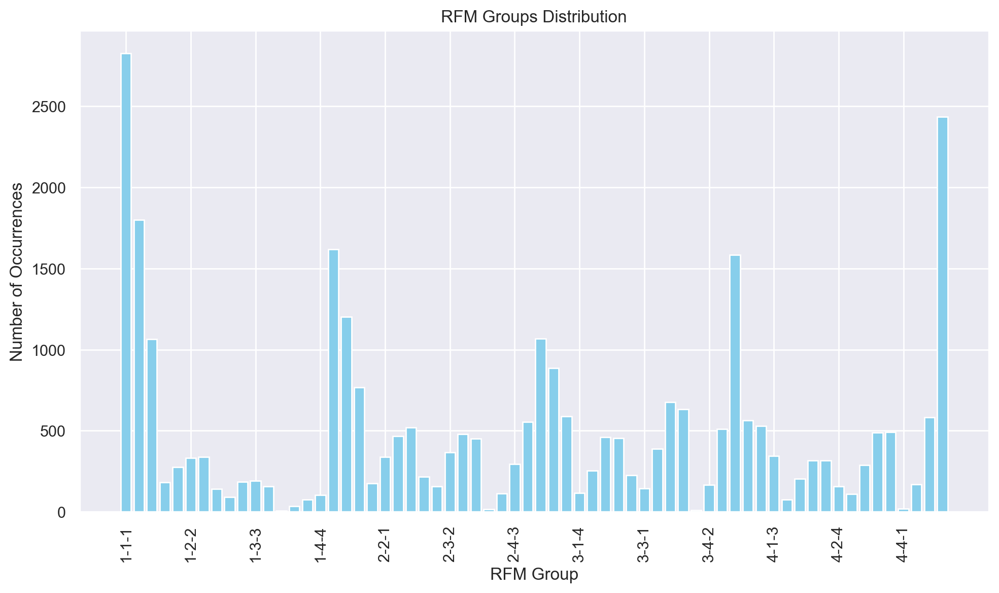

In [7]:
# Step 1: Count the occurrences of each RFM_Group
rfm_counts = df_RFM.groupby(["RFM_Group"]).size().reset_index(name='count')

# Step 2: Plot the result using bar plot (since we are dealing with counts of categories)
plt.figure(figsize=(10, 6))
plt.bar(rfm_counts["RFM_Group"], rfm_counts["count"], color="skyblue")

# Adding labels and title
plt.title("RFM Groups Distribution")
plt.xlabel("RFM Group")
plt.ylabel("Number of Occurrences")

# Show only some x-axis labels (subset of indices)
step = 5  # This controls the frequency of labels to display (every 2nd label)
x_ticks = rfm_counts["RFM_Group"][::step]  # Take every 'step' label
plt.xticks(x_ticks, rotation=90)  # Display those labels

# Displaying the plot
plt.tight_layout()
plt.show()

Using RFM total scores to create more comprehensible groups:

### RFM value segments

In [8]:
df_RFM["RFM_Segment"] = ''

df_RFM.loc[df_RFM["RFM_Score"] > 8, 'RFM_Segment'] = 'High-Value'
df_RFM.loc[(df_RFM["RFM_Score"] > 4) & (df_RFM["RFM_Score"] <= 8), 'RFM_Segment'] = 'Mid-Value'
df_RFM.loc[df_RFM["RFM_Score"] <= 4, 'RFM_Segment'] = 'Low-Value'

df_RFM.head()

,Recency,Frequency,Monetary,R,F,M,RFM_Group,RFM_Score,RFM_Segment
customer_id,,,,,,,,,
1b8f824d5e,1,2,28.88,1,1,3,1-1-3,5,Mid-Value
5d272b9dcb,1,2,19.21,1,1,2,1-1-2,4,Low-Value
f6d1b2ba63,1,2,9.20,1,1,1,1-1-1,3,Low-Value
180c632ed8,2,2,31.56,1,1,3,1-1-3,5,Mid-Value
4eb37a6705,2,2,55.44,1,1,4,1-1-4,6,Mid-Value


The value segments are the following:

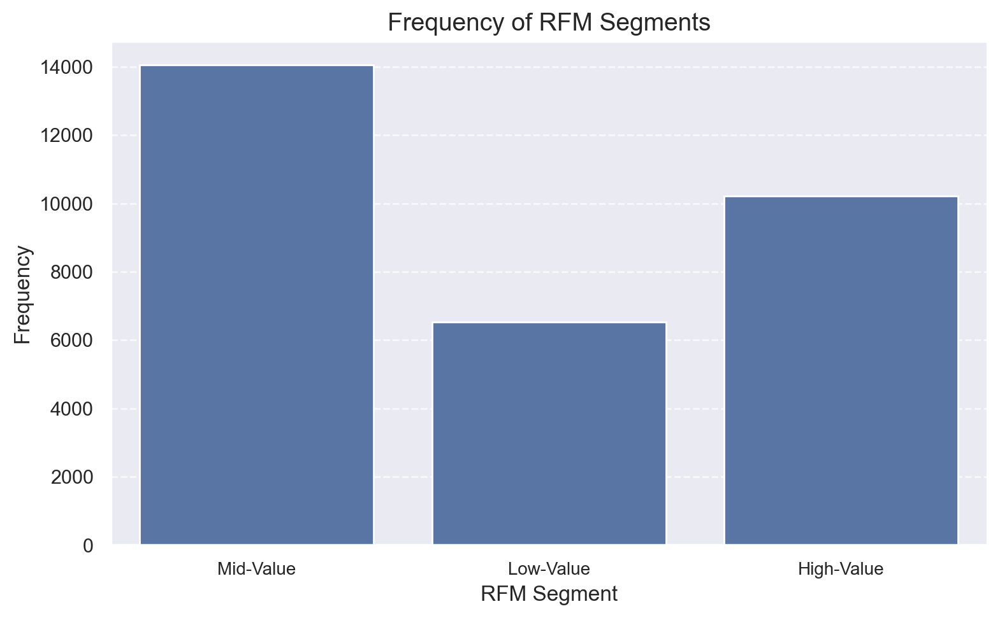

In [9]:
# Create the barplot
plt.figure(figsize=(8, 5))
sns.countplot(data=df_RFM, x='RFM_Segment')

# Customize the plot
plt.title('Frequency of RFM Segments', fontsize=14)
plt.xlabel('RFM Segment', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.xticks(rotation=0, fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

### RFM value group

In [10]:
df_RFM["RFM_Vgroup"] = ''

# High-Value
df_RFM.loc[df_RFM["RFM_Score"] == 12, 'RFM_Vgroup'] = 'VIP'
df_RFM.loc[(df_RFM["RFM_Score"] >= 9) & (df_RFM["RFM_Score"] < 12), 'RFM_Vgroup'] = 'Very Loyal'

# Mid-Value
df_RFM.loc[(df_RFM["RFM_Score"] >= 7) & (df_RFM["RFM_Score"] < 9), 'RFM_Vgroup'] = 'Loyal'
df_RFM.loc[(df_RFM["RFM_Score"] >= 5) & (df_RFM["RFM_Score"] < 7), 'RFM_Vgroup'] = 'At Risk'

# Low-Value
df_RFM.loc[df_RFM["RFM_Score"] == 4, 'RFM_Vgroup'] = 'Almost Lost'
df_RFM.loc[df_RFM["RFM_Score"] == 3, 'RFM_Vgroup'] = 'Lost'

df_RFM.head()

,Recency,Frequency,Monetary,R,F,M,RFM_Group,RFM_Score,RFM_Segment,RFM_Vgroup
customer_id,,,,,,,,,,
1b8f824d5e,1,2,28.88,1,1,3,1-1-3,5,Mid-Value,At Risk
5d272b9dcb,1,2,19.21,1,1,2,1-1-2,4,Low-Value,Almost Lost
f6d1b2ba63,1,2,9.20,1,1,1,1-1-1,3,Low-Value,Lost
180c632ed8,2,2,31.56,1,1,3,1-1-3,5,Mid-Value,At Risk
4eb37a6705,2,2,55.44,1,1,4,1-1-4,6,Mid-Value,At Risk


The value groups are the following:

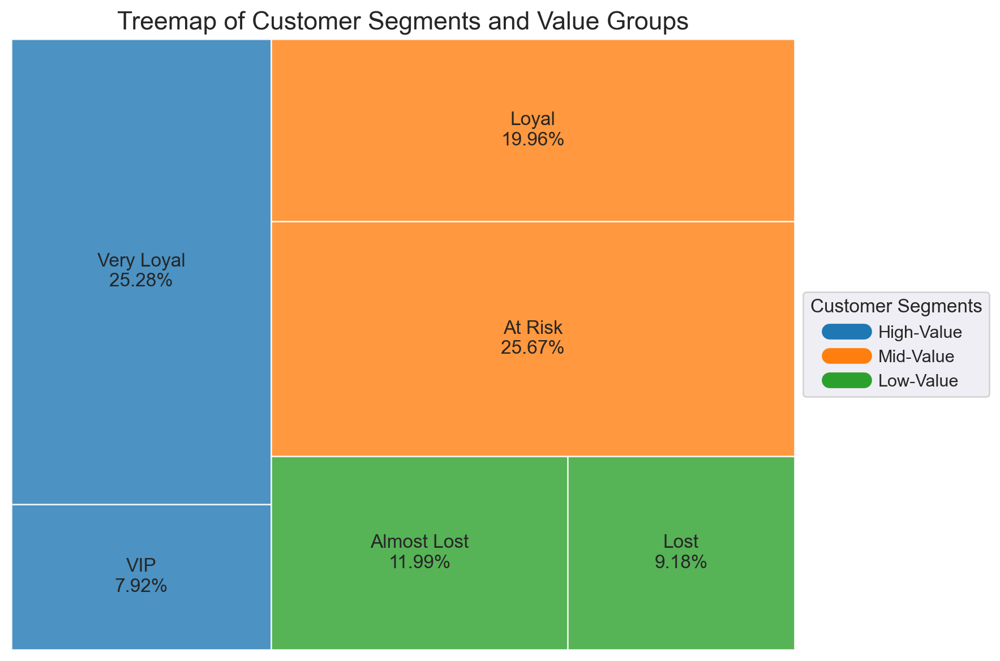

In [11]:
# Assuming df_RFM is your DataFrame
# Group by RFM_Segment and RFM_Vgroup to calculate frequencies
aggregated_data = df_RFM.groupby(['RFM_Segment', 'RFM_Vgroup']).size().reset_index(name='Frequency')

# Calculate percentages
total_count = aggregated_data['Frequency'].sum()
aggregated_data['Percentage'] = (aggregated_data['Frequency'] / total_count) * 100

# Prepare the data for the treemap
sizes = aggregated_data['Percentage']  # Use percentages for sizes
labels = aggregated_data['RFM_Vgroup'] + "\n" + aggregated_data['Percentage'].round(2).astype(str) + "%"  # Display percentages

# Assign colors for RFM segments
colors = {
    'High-Value': '#1f77b4',
    'Mid-Value': '#ff7f0e',
    'Low-Value': '#2ca02c'
}
aggregated_data['Color'] = aggregated_data['RFM_Segment'].map(colors)

# Create the treemap
plt.figure(figsize=(9, 6))
squarify.plot(sizes=sizes, label=labels, color=aggregated_data['Color'], alpha=0.8)
plt.axis('off')
plt.title('Treemap of Customer Segments and Value Groups', fontsize=16)

# Add legend for customer segments
legend_labels = [f"{segment}: {color}" for segment, color in colors.items()]
legend_handles = [plt.Line2D([0], [0], color=color, lw=10) for color in colors.values()]
plt.legend(legend_handles, colors.keys(), title="Customer Segments", bbox_to_anchor=(1, 0.5), loc='center left')

# Show the plot
plt.tight_layout()
plt.show()

# 3. Clustering

* Defining functions for evaluation metrics:

In [75]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst

def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust

## 3.1. K-means and Hierarchical clustering <a class="anchor" id="5.1"></a>

Testing on K-means and Hierarchical clustering

In [13]:
# Set up the clusterers
kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42
)

hierarchical = AgglomerativeClustering(
    metric='euclidean'
)

Finding the optimal clusterer on Demographic variables

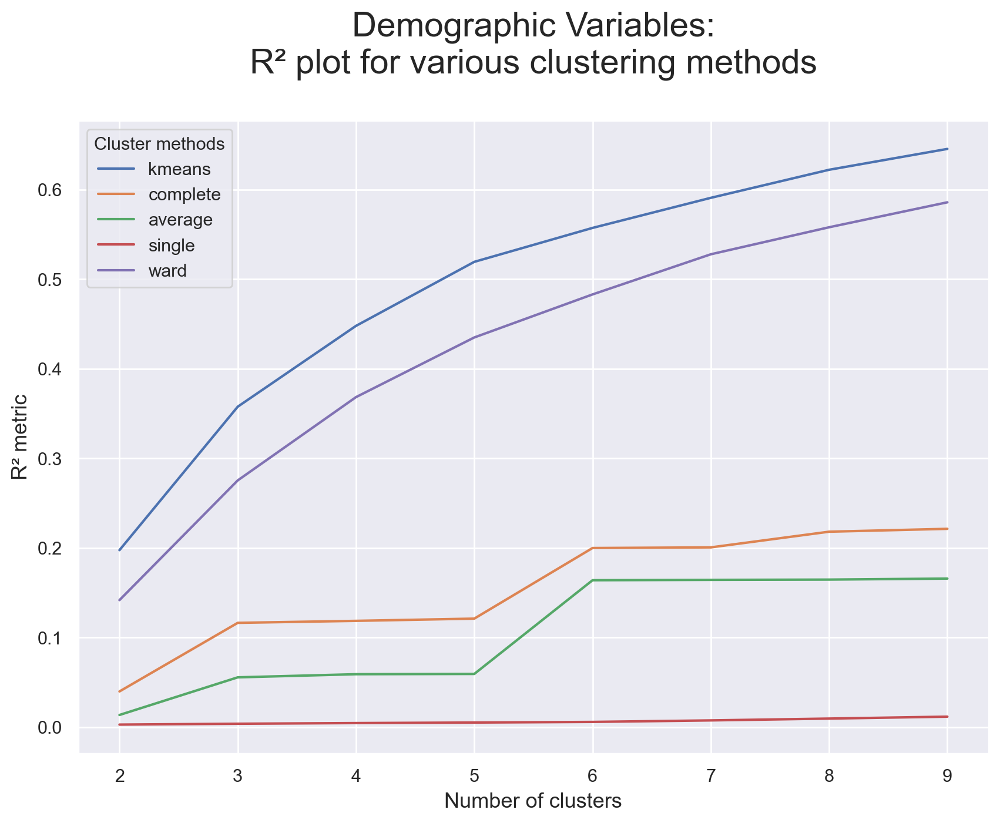

In [14]:
# Obtaining the R² scores for each cluster solution on demographic variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_DEMO, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_DEMO, hierarchical.set_params(linkage=linkage)
    )

# Visualizing the R² scores for each cluster solution on demographic variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Demographic Variables:\nR² plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R² metric", fontsize=13)
plt.show()

We can see the presence of 5 clusters.

Repeat the process for Behavior variables

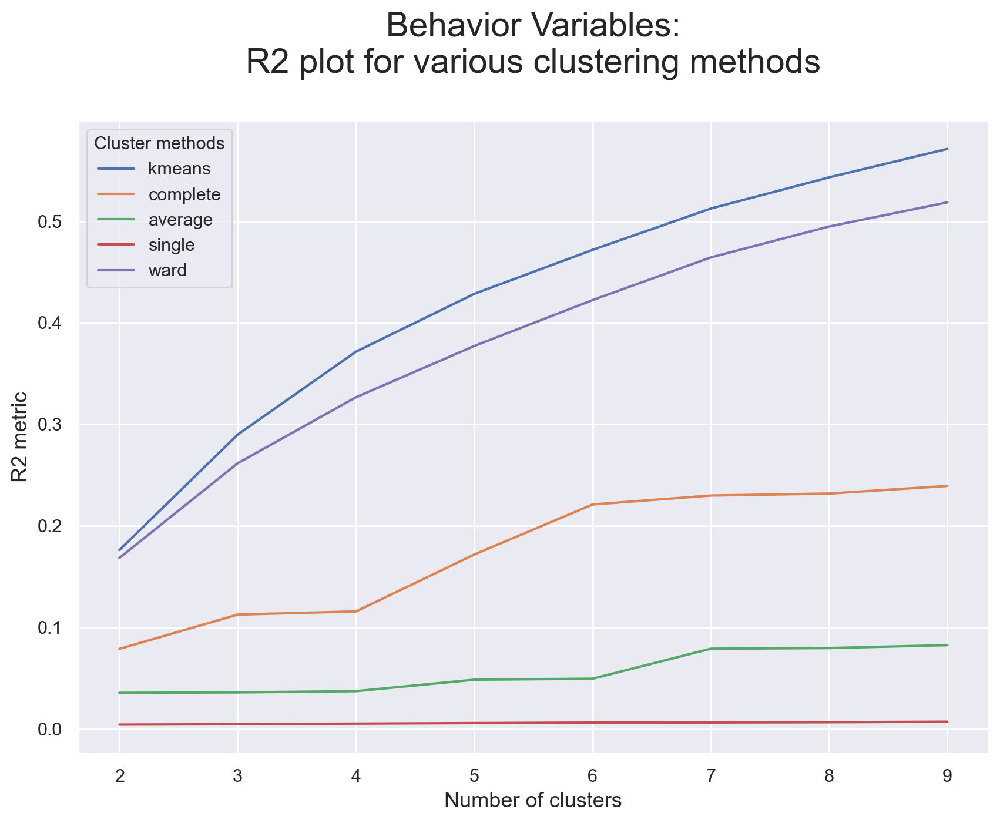

In [15]:
# Obtaining the R² scores for each cluster solution on Behavior variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_BEHAV, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_BEHAV, hierarchical.set_params(linkage=linkage)
    )

# Visualizing the R² scores for each cluster solution on Behavior variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Behavior Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

Once more, the presence of 5 clusters is detected.

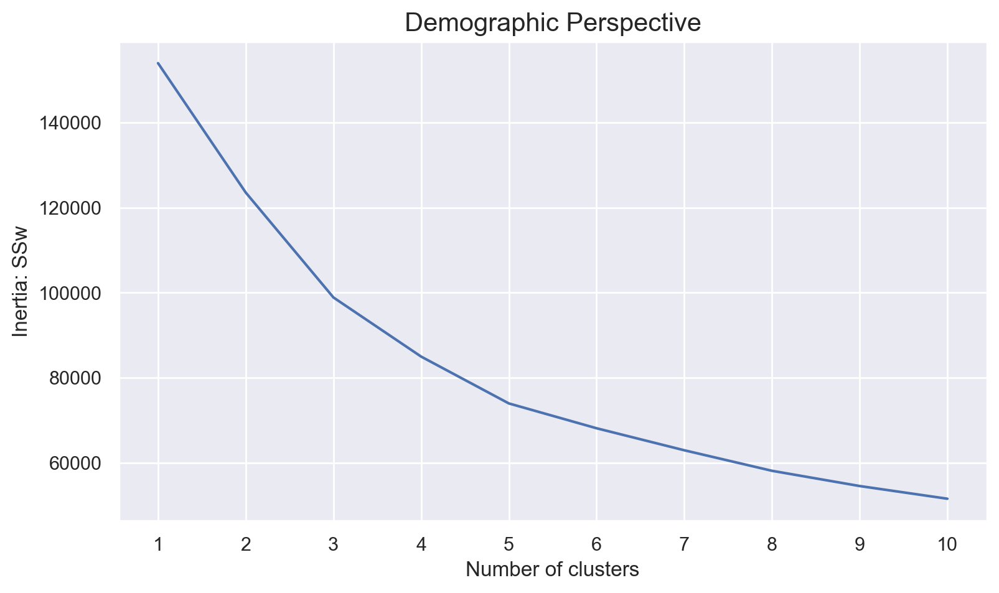

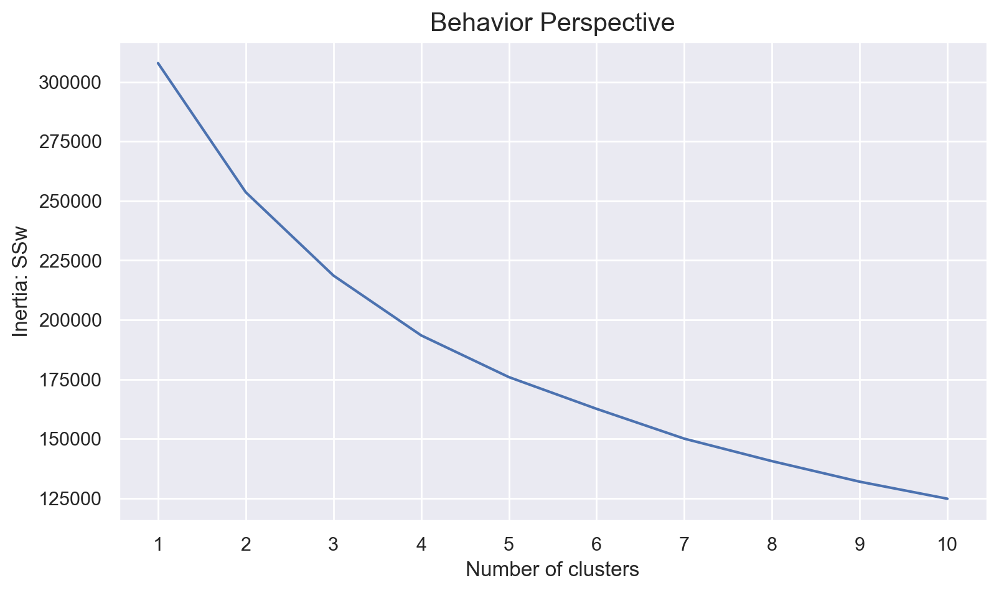

In [16]:
df_list = [df_DEMO, df_BEHAV]
perspectives_names = ["Demographic Perspective", "Behavior Perspective"]

# Iterate through DataFrames and perspectives
for data, title in zip(df_list, perspectives_names):
    range_clusters = range(1, 11)

    inertia = []
    for n_clus in range_clusters:  # iterate over desired ncluster range
        kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
        kmclust.fit(data)
        inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

    # The inertia plot

    fig, ax = plt.subplots(figsize=(9,5))

    ax.plot(range_clusters, inertia)
    ax.set_xticks(range_clusters)
    ax.set_ylabel("Inertia: SSw")
    ax.set_xlabel("Number of clusters")
    ax.set_title(title, size=15)  # Set the title to the corresponding perspective

    plt.show()


In this plot they seem around 3/4, so we will use 4 features for each perspective in the future.

## 3.2 DBSCAN Clustering <a class="anchor" id="5.2"></a>

### 3.2.1 Demographic Perspective

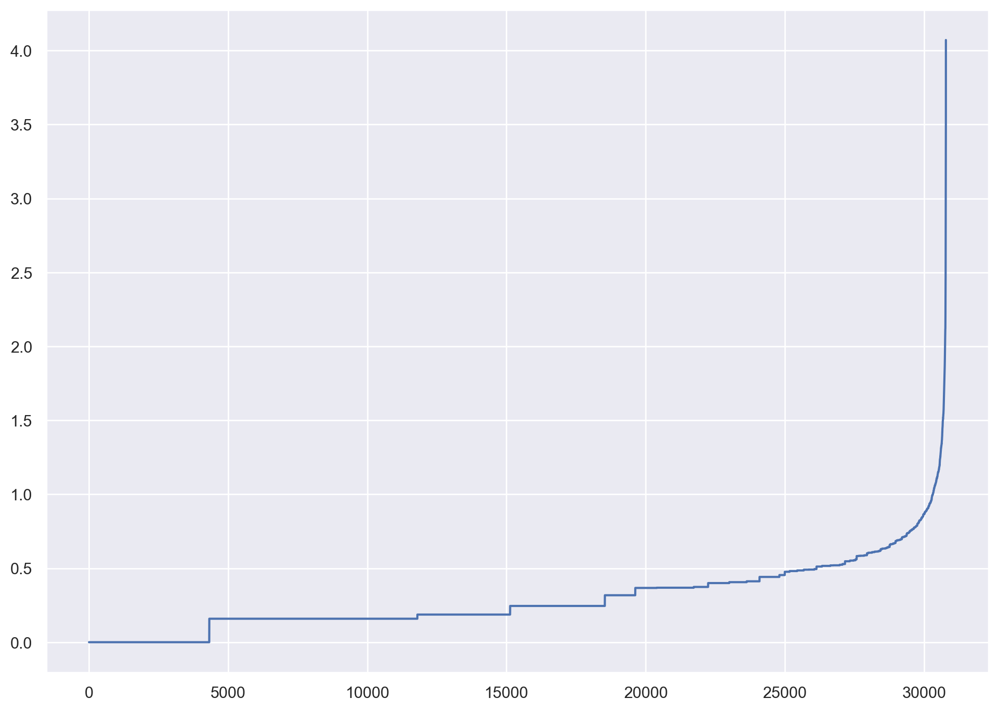

In [18]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=5)
neigh.fit(df_DEMO)
distances, _ = neigh.kneighbors(df_DEMO)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

The sharp rise begins around a distance value, suggesting that a suitable eps value lies in this range.

In [19]:
dbscan = DBSCAN(eps=1.2, min_samples=5, n_jobs=-1)
dbscan_labels = dbscan.fit_predict(df_DEMO)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 4


In [20]:
df_concat = df_DEMO.copy()  # Create a copy of the original dataframe
df_concat["dbscan_labels"] = pd.Series(dbscan_labels, index=df_DEMO.index)  # Ensure index alignment
df_concat.head()

,Week_days_mean,Weekend_days_mean,HR_peak,DOW_Peak,customer_age,dbscan_labels
customer_id,,,,,,
1b8f824d5e,-0.444861,-0.430645,1.208156,-1.320239,-1.446986,0
5d272b9dcb,-0.444861,-0.430645,-0.286086,-1.320239,-1.605708,0
f6d1b2ba63,-0.444861,-0.430645,-0.472866,-1.320239,1.727454,0
180c632ed8,-0.444861,-0.430645,-0.099305,-0.825866,-0.177210,0
4eb37a6705,-0.444861,-0.430645,-0.659646,-0.825866,-1.129542,0


In [21]:
# Detecting noise (potential outliers)
df_concat.loc[df_concat['dbscan_labels'] == -1]

,Week_days_mean,Weekend_days_mean,HR_peak,DOW_Peak,customer_age,dbscan_labels
customer_id,,,,,,
4d43db4f0a,0.655768,6.833182,0.274255,1.645999,1.092566,-1
eb4664b1ac,1.022645,8.195149,-0.099305,1.151626,1.886176,-1
26fa80f66e,4.691409,6.833182,-0.099305,0.657253,-0.335932,-1
730b8daaff,4.324533,9.103128,-0.286086,0.657253,0.933844,-1
1b178d7662,2.123274,10.011106,-0.099305,1.151626,-0.812098,-1
...,...,...,...,...,...,...
b787fd1f72,3.223903,-0.430645,-1.406766,0.162880,1.727454,-1
a9c31c0efa,7.993297,2.293290,0.461035,-0.825866,-0.018488,-1
1c4a79c101,2.490150,4.109247,-0.099305,-0.825866,1.568732,-1


In [22]:
# Computing the R^2 of the cluster solution
df_nonoise = df_concat.loc[df_concat['dbscan_labels'] != -1]
sst = get_ss(df_DEMO)  # get total sum of squares
ssw_labels = df_nonoise.groupby(by='dbscan_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.0655


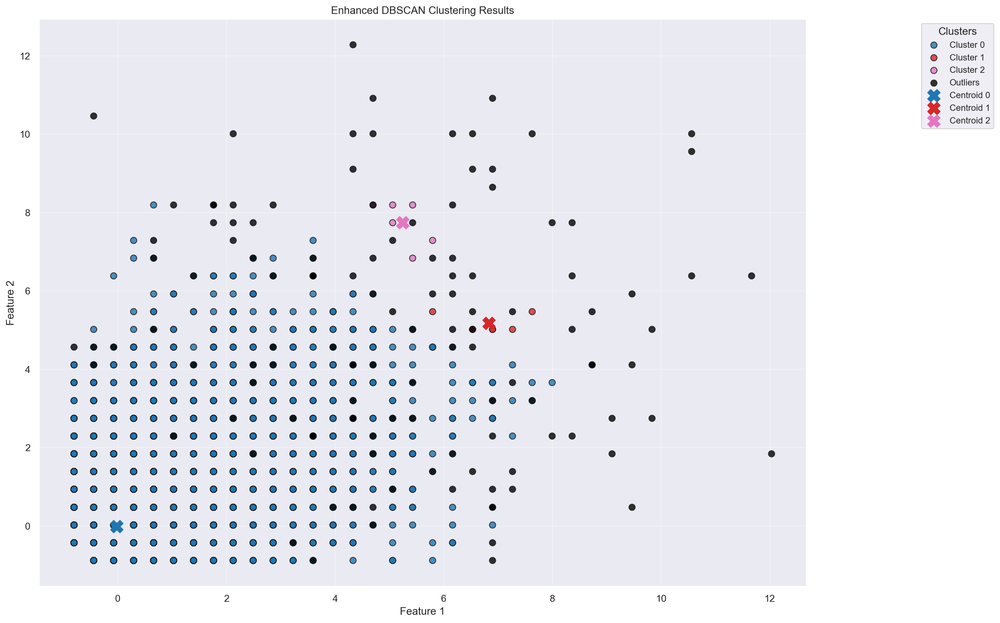

In [23]:
unique_labels = set(dbscan_labels)
num_clusters = len(unique_labels) - (1 if -1 in unique_labels else 0)  # Exclude noise label (-1)
assert num_clusters >= 3, "DBSCAN found fewer than 3 clusters. Adjust DBSCAN parameters."

# Define a color palette
colors = plt.cm.tab10(np.linspace(0, 1, len(unique_labels)))  # Tab10 provides more visually distinct colors
cluster_colors = {label: colors[i] for i, label in enumerate(unique_labels)}

plt.figure(figsize=(16, 10))

# Plot each cluster with a corresponding color
for label in unique_labels:
    color = cluster_colors[label]
    if label == -1:  # Outliers
        color = [0, 0, 0, 1]  # Black for outliers
    subset = df_DEMO[dbscan_labels == label]
    plt.scatter(subset.iloc[:, 0], subset.iloc[:, 1],  # First two dimensions
                s=50, c=[color], label=f"Cluster {label}" if label != -1 else "Outliers", alpha=0.8, edgecolor='k')

# Add cluster centroids
for label in unique_labels:
    if label != -1:  # Skip outliers
        cluster_points = df_DEMO[dbscan_labels == label]
        centroid = cluster_points.mean(axis=0)
        plt.scatter(centroid[0], centroid[1], c=[cluster_colors[label]], marker='X', s=200, label=f"Centroid {label}")

plt.title("Enhanced DBSCAN Clustering Results")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.legend(loc="upper right", bbox_to_anchor=(1.25, 1), title="Clusters", fontsize="small")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

A clustering solution with R² = 0.0655 indicates that the clusters account for a relatively small proportion of the variance in the dataset, suggesting low separability among clusters.

Given the initial number of clusters, and the previous results, we can affirm that DBSCAN is not the most appropriate clustering method for this perspective.

### 3.2.2 Behavioral Perspective

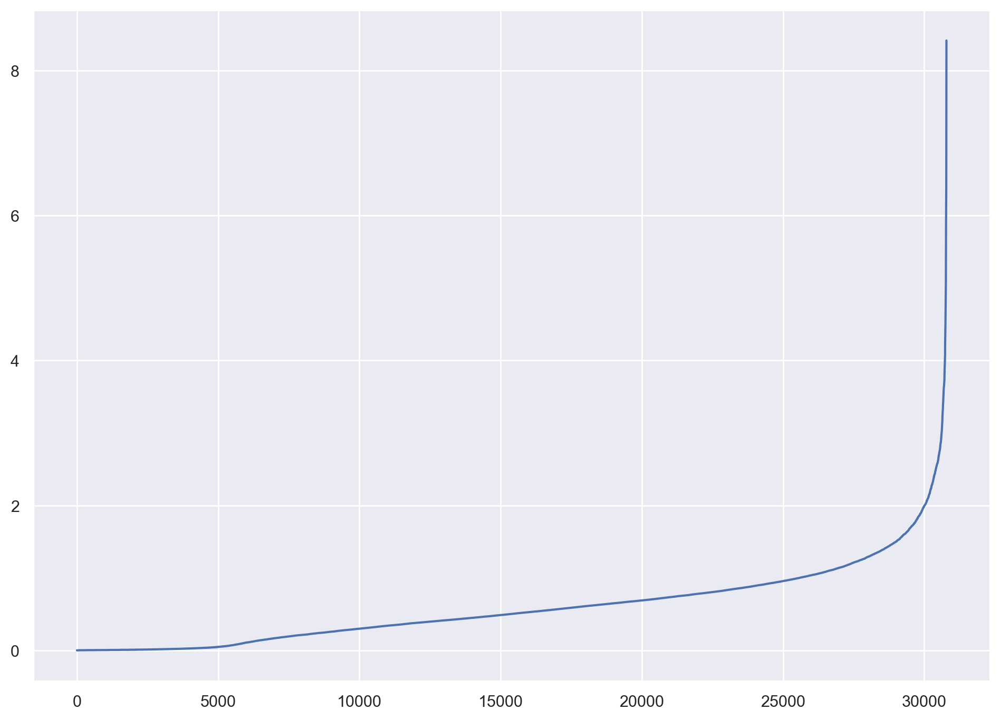

In [24]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=10)
neigh.fit(df_BEHAV)
distances, _ = neigh.kneighbors(df_BEHAV)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [25]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=1.8, min_samples=10, n_jobs=-1)
dbscan_labels = dbscan.fit_predict(df_BEHAV)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 5


In [26]:
df_concat = df_BEHAV.copy()  # Create a copy of the original dataframe
df_concat["dbscan_labels"] = pd.Series(dbscan_labels, index=df_BEHAV.index)  # Ensure index alignment
df_concat.head()

,CUI_American,CUI_Italian,CUI_Asian,CUI_OTHER,Chain_Preference,Order_Frequency,Avg_Spend_per_Order,Product_per_Order,Total_Orders,Customer_Duration,dbscan_labels
customer_id,,,,,,,,,,,
1b8f824d5e,-0.456645,-0.31183,0.504971,-0.600861,-0.332317,1.560249,0.540066,2.920203,-0.507104,-1.169091,0
5d272b9dcb,0.820482,-0.31183,-0.415749,-0.600861,0.959062,1.560249,-0.080420,-0.714576,-0.507104,-1.169091,0
f6d1b2ba63,0.459858,-0.31183,-0.677350,-0.600861,0.959062,1.560249,-0.722722,-0.714576,-0.507104,-1.169091,0
180c632ed8,-0.456645,-0.31183,0.614688,-0.600861,-0.332317,0.756958,0.712031,0.497017,-0.507104,-1.134782,0
4eb37a6705,0.994817,-0.31183,0.995830,-0.600861,-1.623697,0.756958,2.244317,2.920203,-0.507104,-1.134782,0


In [27]:
# Detecting noise (potential outliers)
df_concat.loc[df_concat['dbscan_labels'] == -1]

,CUI_American,CUI_Italian,CUI_Asian,CUI_OTHER,Chain_Preference,Order_Frequency,Avg_Spend_per_Order,Product_per_Order,Total_Orders,Customer_Duration,dbscan_labels
customer_id,,,,,,,,,,,
4d43db4f0a,7.951274,0.686008,-0.053438,-0.600861,0.836074,0.327291,-0.643462,0.093153,3.951172,0.237595,-1
4dfcdff3c0,2.687359,3.126842,0.760431,0.339346,-0.418409,-0.080515,-0.294692,-0.229939,2.543296,0.374833,-1
d6e5be6382,7.815791,1.189449,-0.677350,-0.266888,-0.885765,0.162523,-0.674934,-0.253017,3.951172,0.477761,-1
928baa4e96,6.669166,1.825533,2.306291,-0.600861,0.221131,-0.236201,0.205669,0.843186,2.308649,0.649308,-1
63953d4795,0.105211,-0.311830,3.411646,5.519558,-0.133643,0.194655,-0.209690,-0.434978,5.124403,0.820855,-1
...,...,...,...,...,...,...,...,...,...,...,...
c847c37d96,-0.456645,-0.311830,2.373840,-0.600861,0.959062,3.970122,3.469248,2.920203,-0.507104,-1.203401,-1
98ff666b8e,-0.456645,-0.311830,1.861692,-0.600861,-1.623697,1.560249,6.646111,6.554981,-0.741750,-1.203401,-1
685df16f65,0.881250,-0.311830,-0.677350,2.294436,-1.623697,0.756958,3.131093,2.920203,-0.507104,-1.134782,-1


In [28]:
# Computing the R^2 of the cluster solution
df_nonoise = df_concat.loc[df_concat['dbscan_labels'] != -1]
sst = get_ss(df_BEHAV)  # get total sum of squares
ssw_labels = df_nonoise.groupby(by='dbscan_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.1792


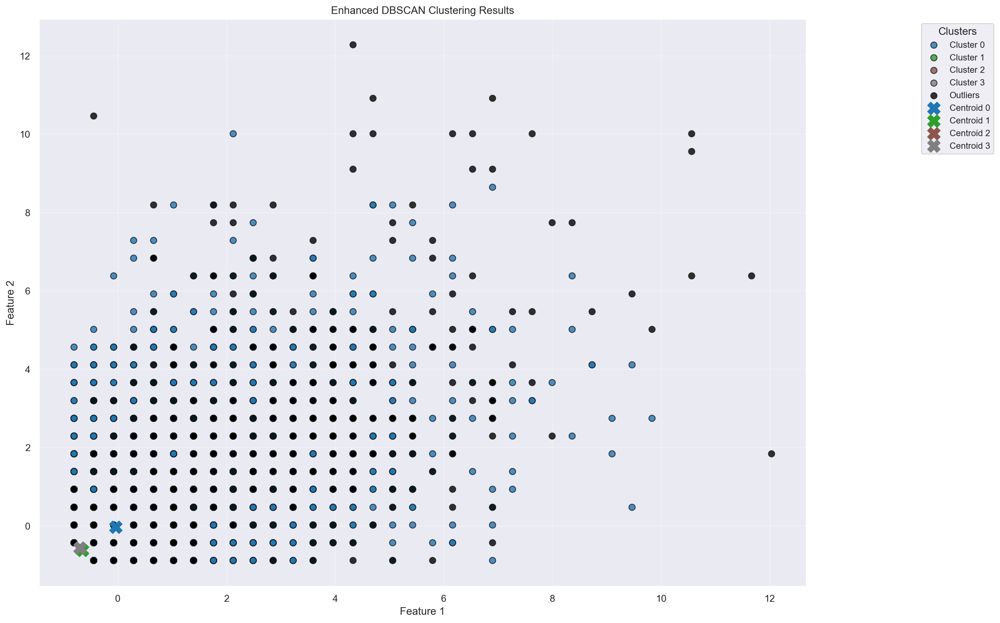

In [29]:
unique_labels = set(dbscan_labels)
num_clusters = len(unique_labels) - (1 if -1 in unique_labels else 0)  # Exclude noise label (-1)
assert num_clusters >= 3, "DBSCAN found fewer than 4 clusters. Adjust DBSCAN parameters."

# Define a color palette
colors = plt.cm.tab10(np.linspace(0, 1, len(unique_labels)))  # Tab10 provides more visually distinct colors
cluster_colors = {label: colors[i] for i, label in enumerate(unique_labels)}

plt.figure(figsize=(16, 10))

# Plot each cluster with a corresponding color
for label in unique_labels:
    color = cluster_colors[label]
    if label == -1:  # Outliers
        color = [0, 0, 0, 1]  # Black for outliers
    subset = df_DEMO[dbscan_labels == label]
    plt.scatter(subset.iloc[:, 0], subset.iloc[:, 1],  # First two dimensions
                s=50, c=[color], label=f"Cluster {label}" if label != -1 else "Outliers", alpha=0.8, edgecolor='k')

# Add cluster centroids
for label in unique_labels:
    if label != -1:  # Skip outliers
        cluster_points = df_DEMO[dbscan_labels == label]
        centroid = cluster_points.mean(axis=0)
        plt.scatter(centroid[0], centroid[1], c=[cluster_colors[label]], marker='X', s=200, label=f"Centroid {label}")

plt.title("Enhanced DBSCAN Clustering Results")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.legend(loc="upper right", bbox_to_anchor=(1.25, 1), title="Clusters", fontsize="small")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

The cluster solution achieved an R² value of 0.1792, indicating that 17.92 % of the variance in the dataset is explained by the 4 identified clusters.

## 3.3  Mean-Shift Clustering

* Demographic Perspective

In [30]:
bandwidth = estimate_bandwidth(df_DEMO, quantile=0.38, random_state=1, n_jobs=-1)
bandwidth

2.5275814462153012

In [31]:
# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=-1)
ms_labels = ms.fit_predict(df_DEMO)

ms_n_clusters = len(np.unique(ms_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)

Number of estimated clusters : 5


In [32]:
# Concatenating the labels to df
df_concat = df_DEMO.copy()  # Create a copy of the original dataframe
df_concat["ms_labels"] = pd.Series(ms_labels, index=df_DEMO.index)  # Ensure index alignment
df_concat.head()

,Week_days_mean,Weekend_days_mean,HR_peak,DOW_Peak,customer_age,ms_labels
customer_id,,,,,,
1b8f824d5e,-0.444861,-0.430645,1.208156,-1.320239,-1.446986,0
5d272b9dcb,-0.444861,-0.430645,-0.286086,-1.320239,-1.605708,0
f6d1b2ba63,-0.444861,-0.430645,-0.472866,-1.320239,1.727454,0
180c632ed8,-0.444861,-0.430645,-0.099305,-0.825866,-0.177210,0
4eb37a6705,-0.444861,-0.430645,-0.659646,-0.825866,-1.129542,0


In [33]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_DEMO)  # get total sum of squares
ssw_labels = df_concat.groupby(by='ms_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.0971


* Behavioral Perspective

In [34]:
bandwidth = estimate_bandwidth(df_BEHAV, quantile=0.8, random_state=1, n_jobs=-1)
bandwidth

4.84791109761374

In [35]:
# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=-1)
ms_labels = ms.fit_predict(df_BEHAV)

ms_n_clusters = len(np.unique(ms_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)

Number of estimated clusters : 4


In [36]:
# Concatenating the labels to df
df_concat = df_BEHAV.copy()  # Create a copy of the original dataframe
df_concat["ms_labels"] = pd.Series(ms_labels, index=df_BEHAV.index)  # Ensure index alignment
df_concat.head()

,CUI_American,CUI_Italian,CUI_Asian,CUI_OTHER,Chain_Preference,Order_Frequency,Avg_Spend_per_Order,Product_per_Order,Total_Orders,Customer_Duration,ms_labels
customer_id,,,,,,,,,,,
1b8f824d5e,-0.456645,-0.31183,0.504971,-0.600861,-0.332317,1.560249,0.540066,2.920203,-0.507104,-1.169091,0
5d272b9dcb,0.820482,-0.31183,-0.415749,-0.600861,0.959062,1.560249,-0.080420,-0.714576,-0.507104,-1.169091,0
f6d1b2ba63,0.459858,-0.31183,-0.677350,-0.600861,0.959062,1.560249,-0.722722,-0.714576,-0.507104,-1.169091,0
180c632ed8,-0.456645,-0.31183,0.614688,-0.600861,-0.332317,0.756958,0.712031,0.497017,-0.507104,-1.134782,0
4eb37a6705,0.994817,-0.31183,0.995830,-0.600861,-1.623697,0.756958,2.244317,2.920203,-0.507104,-1.134782,0


In [37]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_BEHAV)  # get total sum of squares
ssw_labels = df_concat.groupby(by='ms_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.0639


In order to reduce the number of clusters, we had to raise the value of quantile, to merge nearby clusters into fewer groups. This resulted in an unsatisfying result of R^2 (Demographic: ~9.71% and Behavioral: ~6.39%) for both perspectives.

## 3.4 Gaussian Mixture Model (GMM)

* Demographic Perspective

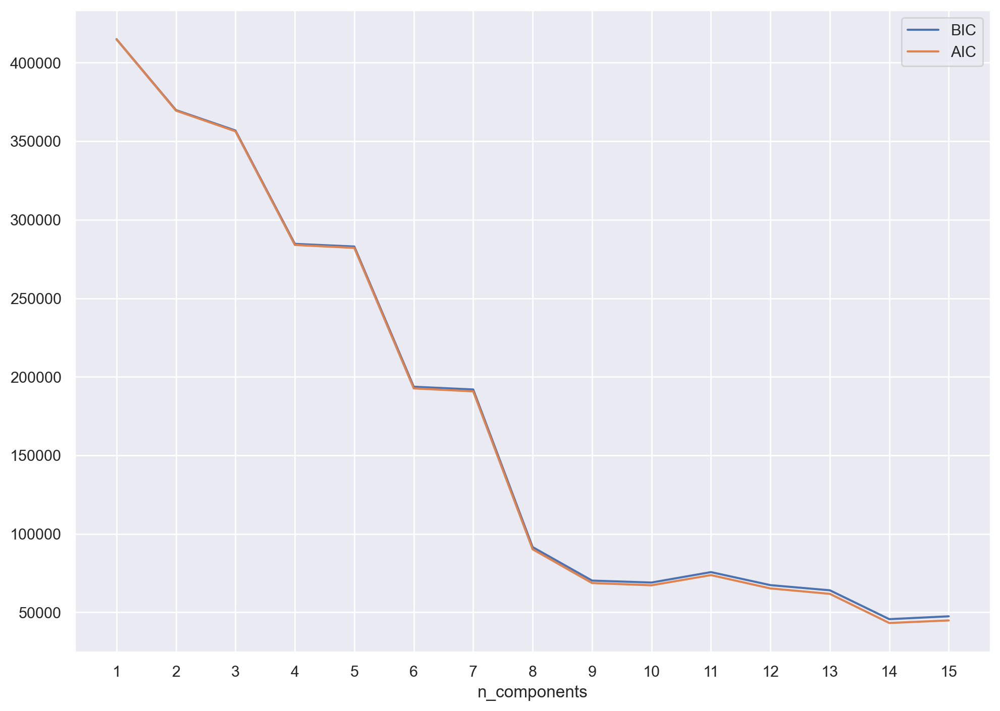

In [38]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 16)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(df_DEMO)
          for n in n_components]

bic_values = [m.bic(df_DEMO) for m in models]
aic_values = [m.aic(df_DEMO) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

Graph suggests 8 components.

In [39]:
# Performing GMM clustering
gmm = GaussianMixture(n_components=8, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(df_DEMO)

In [40]:
df_concat = df_DEMO.copy()  # Create a copy of the original dataframe
df_concat["gmm_labels"] = pd.Series(gmm_labels, index=df_DEMO.index)  # Ensure index alignment
df_concat.head()

,Week_days_mean,Weekend_days_mean,HR_peak,DOW_Peak,customer_age,gmm_labels
customer_id,,,,,,
1b8f824d5e,-0.444861,-0.430645,1.208156,-1.320239,-1.446986,2
5d272b9dcb,-0.444861,-0.430645,-0.286086,-1.320239,-1.605708,2
f6d1b2ba63,-0.444861,-0.430645,-0.472866,-1.320239,1.727454,2
180c632ed8,-0.444861,-0.430645,-0.099305,-0.825866,-0.177210,2
4eb37a6705,-0.444861,-0.430645,-0.659646,-0.825866,-1.129542,2


In [41]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_DEMO)  # get total sum of squares
ssw_labels = df_concat.groupby(by='gmm_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.3274


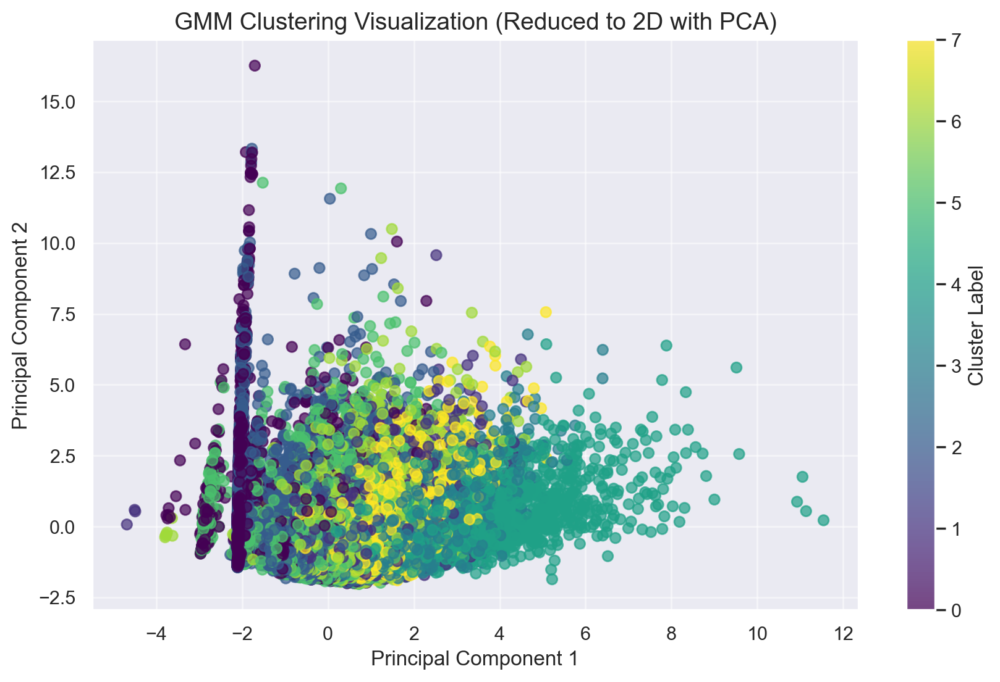

In [42]:
# Reducing dimensionality for visualization
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(df_BEHAV)

# Creating a scatter plot
plt.figure(figsize=(10, 6))
scatter = plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=gmm_labels, cmap='viridis', alpha=0.7)
plt.colorbar(scatter, label="Cluster Label")
plt.title('GMM Clustering Visualization (Reduced to 2D with PCA)', fontsize=14)
plt.xlabel('Principal Component 1', fontsize=12)
plt.ylabel('Principal Component 2', fontsize=12)
plt.grid(alpha=0.5)
plt.show()

* Behavioral Perspective

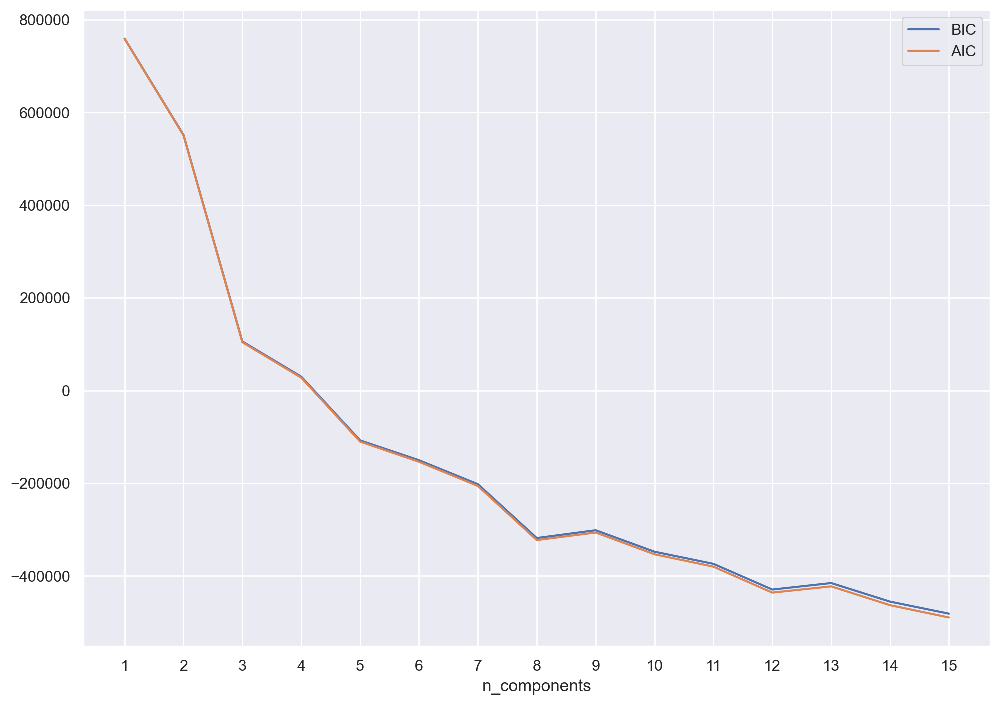

In [43]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 16)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(df_BEHAV)
          for n in n_components]

bic_values = [m.bic(df_BEHAV) for m in models]
aic_values = [m.aic(df_BEHAV) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

Graph suggests 7 to 8 components.

In [53]:
# Performing GMM clustering
gmm = GaussianMixture(n_components=7, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(df_BEHAV)

In [54]:
df_concat = df_BEHAV.copy()  # Create a copy of the original dataframe
df_concat["gmm_labels"] = pd.Series(gmm_labels, index=df_BEHAV.index)  # Ensure index alignment
df_concat.head()

,CUI_American,CUI_Italian,CUI_Asian,CUI_OTHER,Chain_Preference,Order_Frequency,Avg_Spend_per_Order,Product_per_Order,Total_Orders,Customer_Duration,gmm_labels
customer_id,,,,,,,,,,,
1b8f824d5e,-0.456645,-0.31183,0.504971,-0.600861,-0.332317,1.560249,0.540066,2.920203,-0.507104,-1.169091,5
5d272b9dcb,0.820482,-0.31183,-0.415749,-0.600861,0.959062,1.560249,-0.080420,-0.714576,-0.507104,-1.169091,5
f6d1b2ba63,0.459858,-0.31183,-0.677350,-0.600861,0.959062,1.560249,-0.722722,-0.714576,-0.507104,-1.169091,5
180c632ed8,-0.456645,-0.31183,0.614688,-0.600861,-0.332317,0.756958,0.712031,0.497017,-0.507104,-1.134782,5
4eb37a6705,0.994817,-0.31183,0.995830,-0.600861,-1.623697,0.756958,2.244317,2.920203,-0.507104,-1.134782,5


In [55]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_BEHAV)  # get total sum of squares
ssw_labels = df_concat.groupby(by='gmm_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.3336


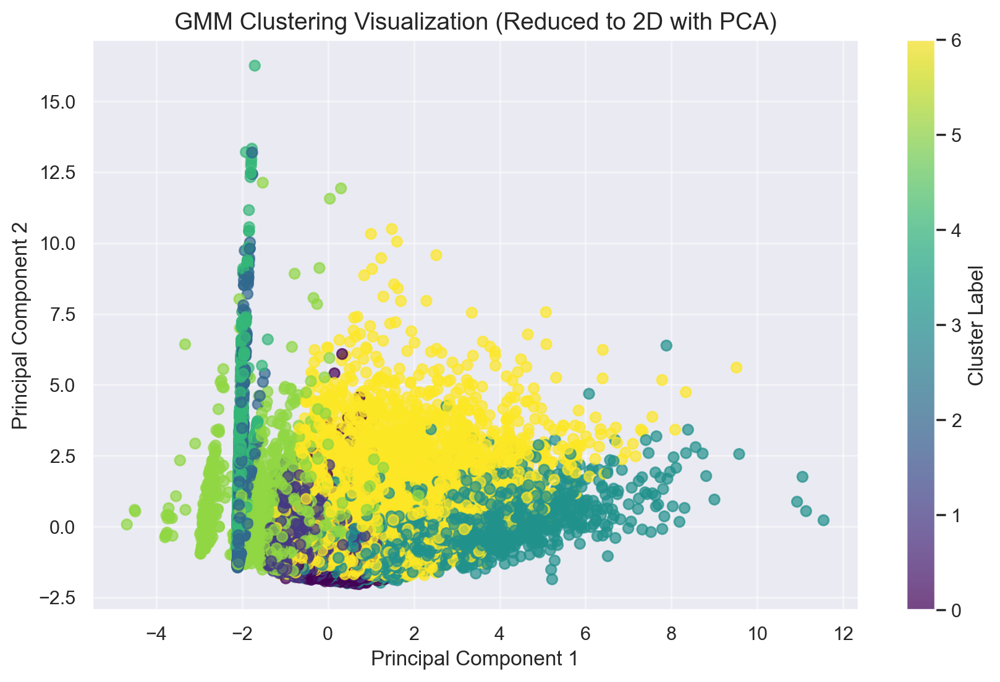

In [56]:
# Reducing dimensionality for visualization
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(df_BEHAV)

# Creating a scatter plot
plt.figure(figsize=(10, 6))
scatter = plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=gmm_labels, cmap='viridis', alpha=0.7)
plt.colorbar(scatter, label="Cluster Label")
plt.title('GMM Clustering Visualization (Reduced to 2D with PCA)', fontsize=14)
plt.xlabel('Principal Component 1', fontsize=12)
plt.ylabel('Principal Component 2', fontsize=12)
plt.grid(alpha=0.5)
plt.show()

## 3.5. Self-Organizing Map (SOM)

### 3.5.1 Demographic Perspective

#### Component Planes (Perspective 1):

In [57]:
# Define the grid size (e.g., 10x10 grid)
M = 50  # Number of rows in the map
N = 50  # Number of columns in the map

# Define the learning parameters
neighborhood_function = "gaussian"  # Type of neighborhood function
topology = 'hexagonal'  # Type of topology for the map (corrected here)
n_feats = len(df_DEMO.columns)  # Number of features (columns in the dataset)
learning_rate = 0.7  # Initial learning rate

# Prepare the data for SOM: use the values from df_DEMO
som_data = df_DEMO.values  # Convert DataFrame to numpy array

# Initialize the SOM
sm = MiniSom(M, N,              # Grid size (10x10 map)
             n_feats,           # Number of features (columns in the dataset)
             learning_rate=learning_rate,
             topology=topology,
             neighborhood_function=neighborhood_function,
             activation_distance='euclidean',
             random_seed=42)

# Initialize the weights randomly using the data
sm.random_weights_init(som_data)

# Print initial quantization and topographic error
print("Before training:")
print("QE (Quantization Error):", np.round(sm.quantization_error(som_data), 4))

# Train the SOM
sm.train_batch(som_data, 500000)  # Training for 500,000 iterations

# Print final quantization and topographic error
print("\nAfter training:")
print("QE (Quantization Error):", np.round(sm.quantization_error(som_data), 4))

Before training:
QE (Quantization Error): 0.3496

After training:
QE (Quantization Error): 0.2858


* Defining the function to plot the Component Planes:

In [58]:
def plot_hexagons(som,              # Trained SOM model
                  sf,               # matplotlib figure object
                  colornorm,        # colornorm
                  matrix_vals,      # SOM weights or matrix values
                  label="",         # title for figure
                  cmap=cm.gray,     # colormap to use
                  annot=False       # Annotate hexagons with values
                  ):

    axs = sf.subplots(1, 1)

    for i in range(matrix_vals.shape[0]):
        for j in range(matrix_vals.shape[1]):
            # Convert SOM grid coordinates to Euclidean coordinates
            wx, wy = som.convert_map_to_euclidean((i, j))

            # Create hexagon with the corresponding color
            hexagon = RegularPolygon((wx, wy),
                                      numVertices=6,
                                      radius=np.sqrt(1 / 3),
                                      facecolor=cmap(colornorm(matrix_vals[i, j])),
                                      alpha=1,
                                      edgecolor='white',
                                      linewidth=0.5)
            axs.add_patch(hexagon)

            # Annotate hexagons with values if required
            if annot:
                annot_val = np.round(matrix_vals[i, j], 2)
                if int(annot_val) == annot_val:  # Format integers cleanly
                    annot_val = int(annot_val)
                axs.text(wx, wy, annot_val,
                         ha='center', va='center',
                         fontsize='x-small')

    # Adjust plot appearance
    axs.margins(0.05)
    axs.set_aspect('equal')
    axs.axis("off")
    axs.set_title(label)

    # Add colorbar
    divider = make_axes_locatable(axs)
    ax_cb = divider.append_axes("right", size="5%", pad=0.05)

    # Create a ScalarMappable for the colorbar
    cmap_sm = plt.cm.ScalarMappable(cmap=cmap, norm=colornorm)
    cmap_sm.set_array([])

    # Create and add colorbar
    cb = Colorbar(ax_cb, cmap_sm, orientation='vertical')
    cb.ax.get_yaxis().labelpad = 6

    return sf

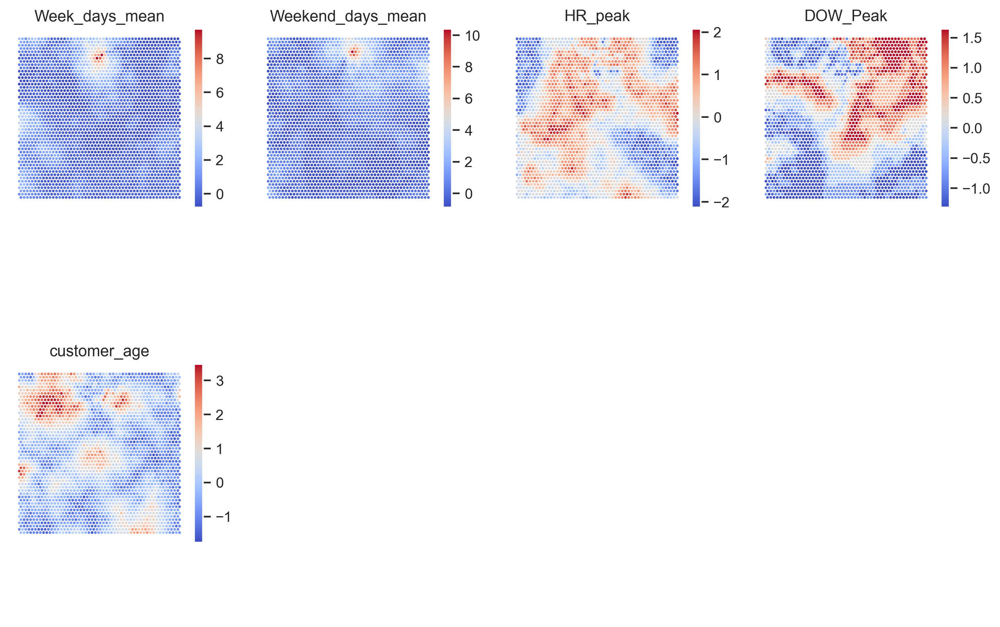

In [59]:
weights = sm.get_weights()

# Set up figure for component planes
figsize = (10, 7)
fig = plt.figure(figsize=figsize, constrained_layout=True, dpi=128)
subfigs = fig.subfigures(2, 4, wspace=0.2)

# Iterate through each feature and plot its component plane
for cpi, sf in zip(range(len(df_DEMO.columns)), subfigs.flatten()):
    # Extract weights for the current feature (component plane)
    matrix_vals = weights[:, :, cpi]

    # Normalize the color scale for the current plane
    vext = np.max(np.abs([np.min(matrix_vals), np.max(matrix_vals)]))
    colornorm = mpl_colors.Normalize(vmin=np.min(matrix_vals), vmax=np.max(matrix_vals))
    # Alternatively, use CenteredNorm if centered color scales are desired:
    # colornorm = mpl_colors.CenteredNorm(vcenter=0, halfrange=vext)

    # Plot the hexagons for the current component plane
    sf = plot_hexagons(
        sm,                                 # Trained SOM
        sf,                                # Subfigure for the current component
        colornorm,                         # Normalization for colors
        matrix_vals,                       # Component plane values
        label=df_DEMO.columns[cpi],  # Feature name for the title
        cmap=cm.coolwarm                   # Colormap for visualization
    )

plt.show()

#### U-Matrix (Perspective 1):

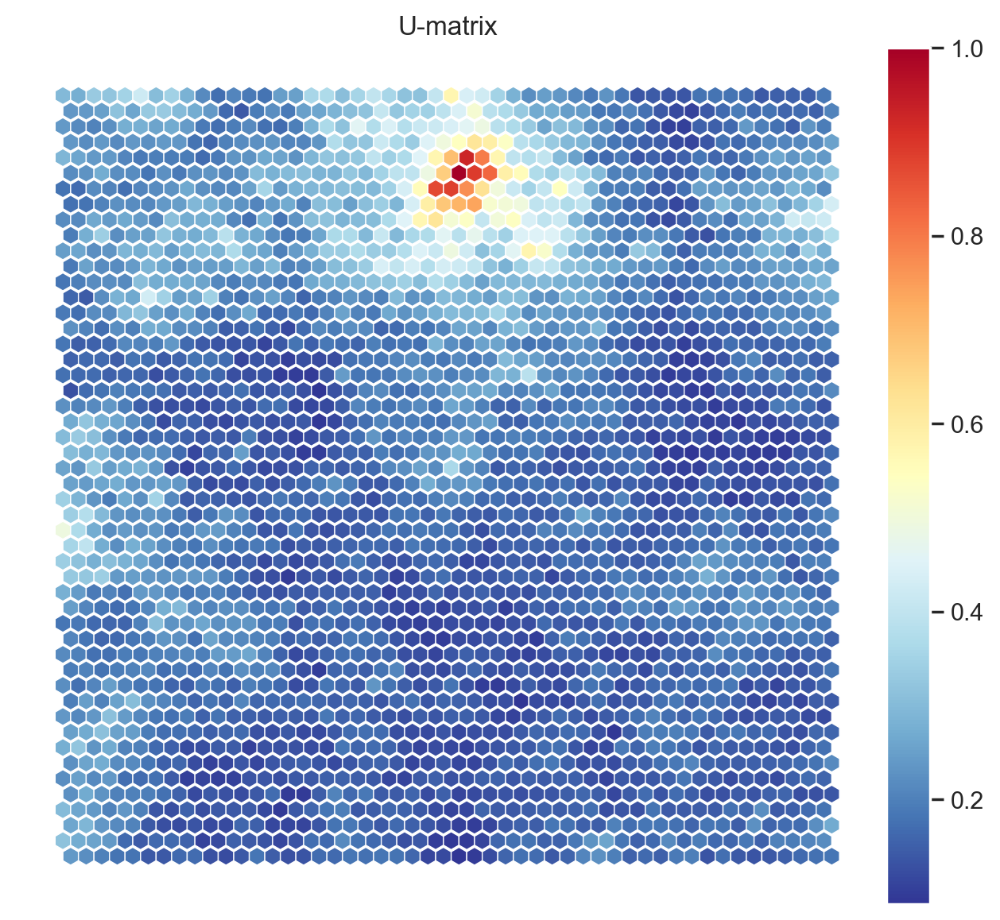

In [60]:
umatrix = sm.distance_map(scaling='mean')
fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=np.min(umatrix), vmax=np.max(umatrix))

fig = plot_hexagons(sm, fig,
                    colornorm,
                    umatrix,
                    label="U-matrix",
                    cmap=cm.RdYlBu_r,
                    annot=False
                    )

#### Hitmap (Perspective 1):

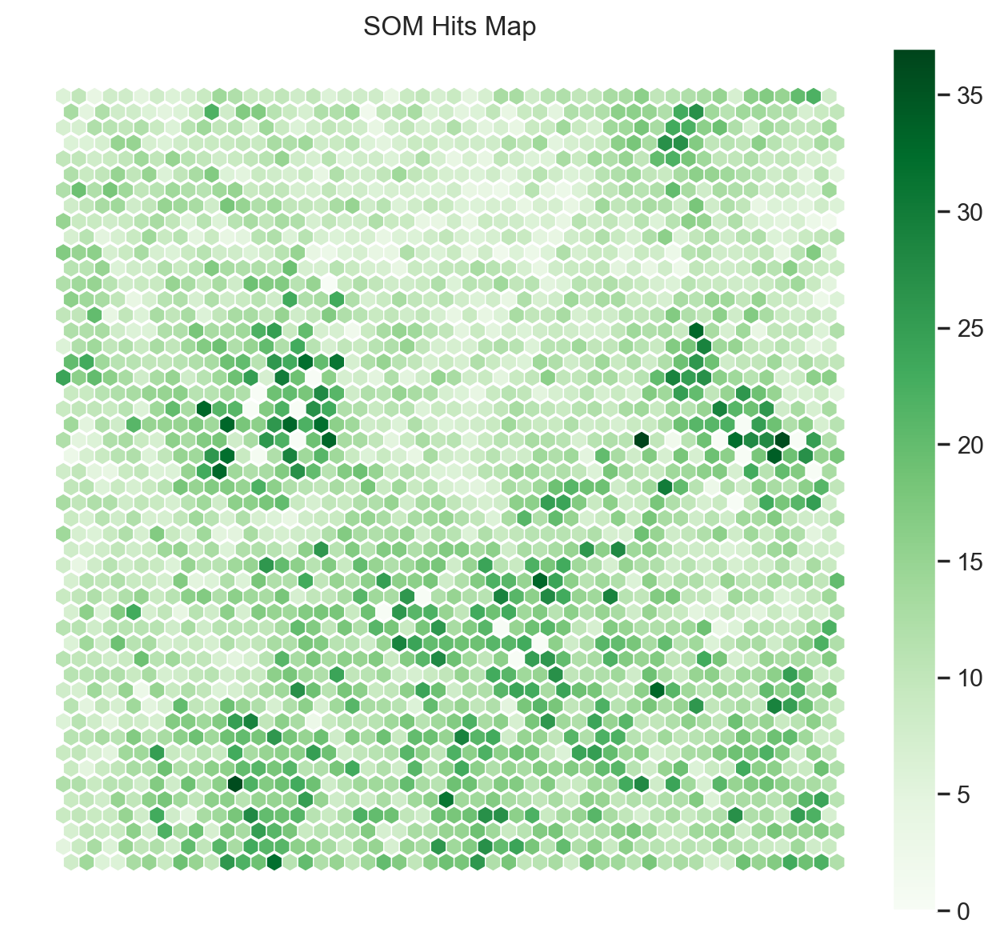

In [61]:
hitsmatrix = sm.activation_response(df_DEMO.values)


fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hitsmatrix))

fig = plot_hexagons(sm, fig,
                    colornorm,
                    hitsmatrix,
                    label="SOM Hits Map",
                    cmap=cm.Greens,
                    annot=False
                    )

#### K-Means on top of SOM units

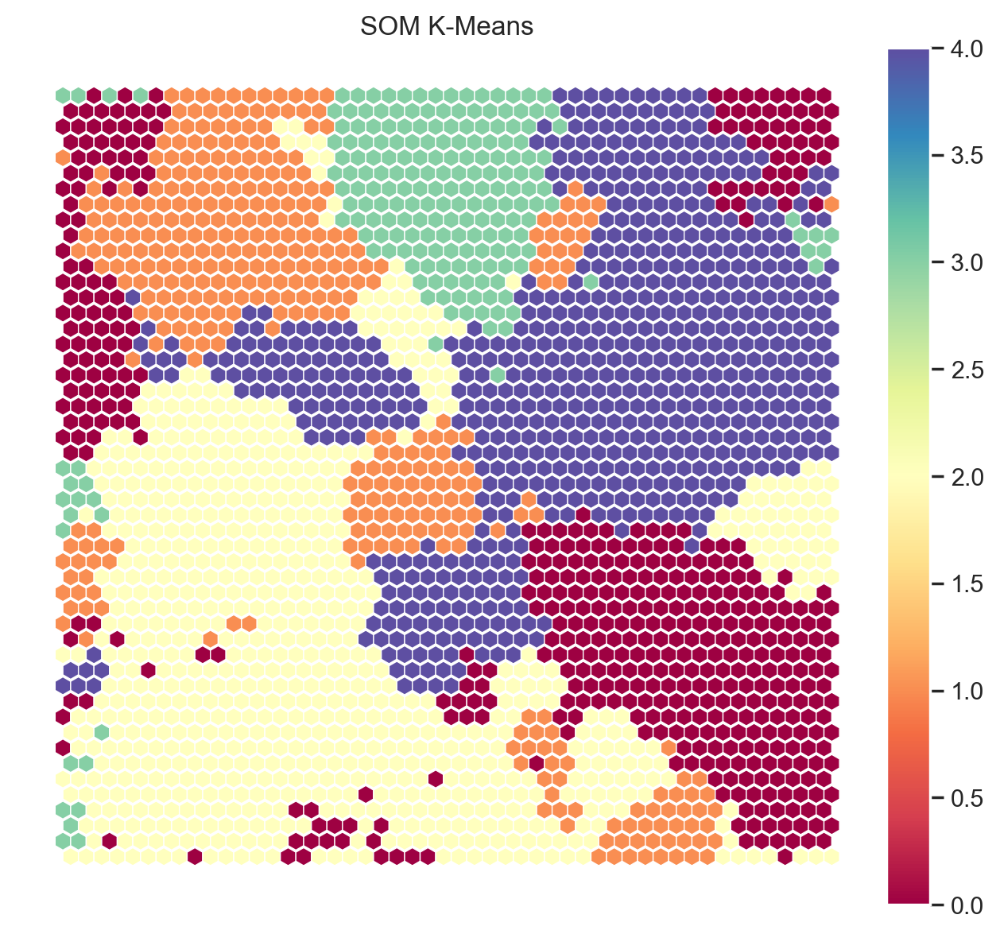

In [62]:
weights_flat = sm.get_weights().reshape((M*N),len(df_DEMO.columns))

kmeans = KMeans(n_clusters=5, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(weights_flat)

kmeans_matrix = nodeclus_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(kmeans_matrix))

fig = plot_hexagons(sm, fig,
                    colornorm,
                    kmeans_matrix,
                    label="SOM K-Means",
                    cmap=cm.Spectral,
                    )

#### Hierarchical Clustering on top of SOM units

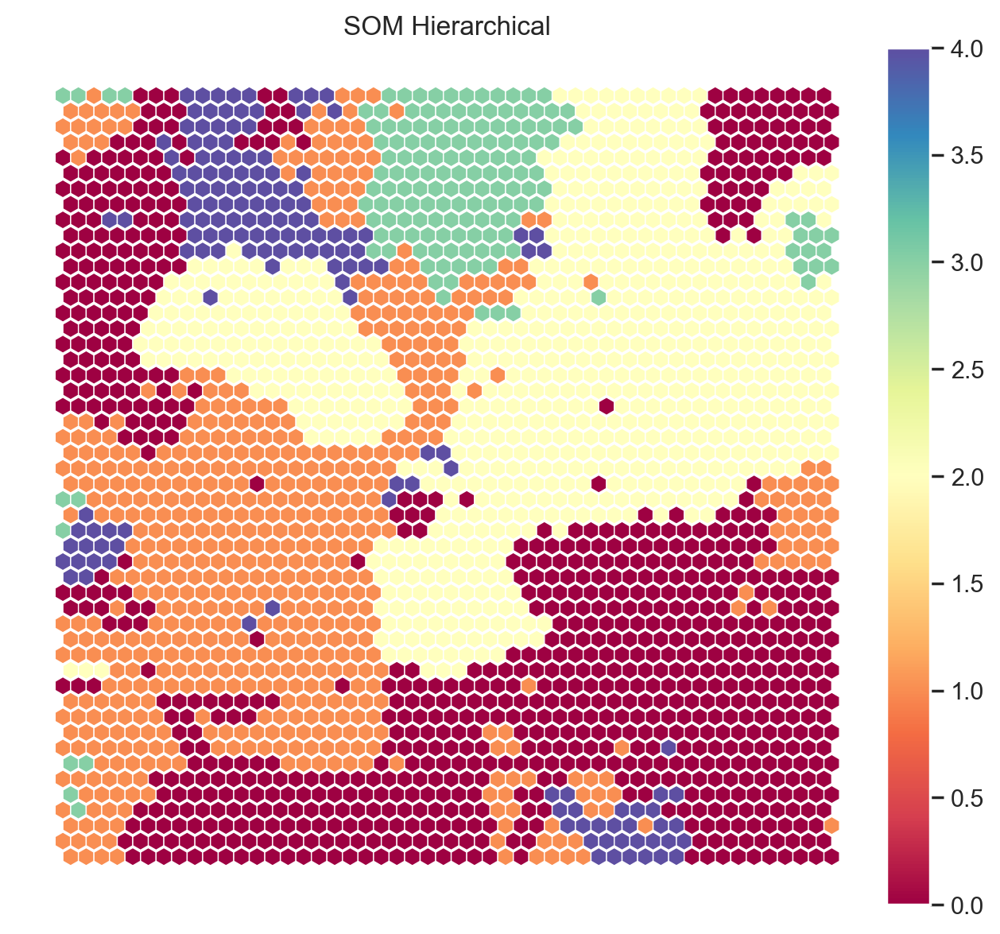

In [63]:
# Perform Hierarchical clustering on top of the MxN units

hierclust = AgglomerativeClustering(n_clusters=5, linkage='ward')
nodeclus_labels = hierclust.fit_predict(weights_flat)
hclust_matrix = nodeclus_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hclust_matrix))

fig = plot_hexagons(sm, fig,
                    colornorm,
                    hclust_matrix,
                    label="SOM Hierarchical",
                    cmap=cm.Spectral,
                    )

#### Final SOM Clustering solution - df_DEMO

In [67]:
df_nodes = pd.DataFrame(weights_flat, columns=df_DEMO.columns)
df_nodes['label'] = nodeclus_labels
df_nodes.head()

,Week_days_mean,Weekend_days_mean,HR_peak,DOW_Peak,customer_age,label
0,0.474765,1.363434,-0.192887,-1.187146,-0.112722,1
1,0.763731,2.273382,-0.309289,-0.679832,-1.068991,1
2,1.556260,2.396842,-0.029810,-1.149023,-0.889433,1
3,2.233260,1.914363,-0.266575,-1.115193,-0.461977,1
4,2.156136,0.594682,-0.226885,-1.308387,-0.672678,3


In [73]:
## This gets BMU coordinates, e.g. (4,4) for each data point
bmu_index = np.array([sm.winner(x) for x in df_DEMO.values])

som_final_labels = [hclust_matrix[i[0]][i[1]] for i in bmu_index]

df_DEMO_som = pd.concat([
                df_DEMO,
                pd.Series(som_final_labels, name='label', index=df_DEMO.index)
            ], axis=1
            )

df_DEMO_som.head()

,Week_days_mean,Weekend_days_mean,HR_peak,DOW_Peak,customer_age,label
customer_id,,,,,,
1b8f824d5e,-0.444861,-0.430645,1.208156,-1.320239,-1.446986,1
5d272b9dcb,-0.444861,-0.430645,-0.286086,-1.320239,-1.605708,0
f6d1b2ba63,-0.444861,-0.430645,-0.472866,-1.320239,1.727454,4
180c632ed8,-0.444861,-0.430645,-0.099305,-0.825866,-0.177210,0
4eb37a6705,-0.444861,-0.430645,-0.659646,-0.825866,-1.129542,0


In [74]:
# perform groupby and mean calculation
df_DEMO_som.groupby('label').mean()

,Week_days_mean,Weekend_days_mean,HR_peak,DOW_Peak,customer_age
label,,,,,
0,-0.175973,-0.394320,-0.852591,-0.401892,-0.133185
1,0.358916,-0.178739,0.690315,-0.602236,-0.209885
2,-0.520153,0.289593,0.425812,1.100625,0.005863
3,2.987452,2.987753,0.295550,0.204371,-0.134733
4,0.227032,-0.341437,0.367645,-0.762386,2.073822


#### Analysing the appropriatness

##### R²

In [76]:
sst = get_ss(df_DEMO_som)  # get total sum of squares
ssw_labels = df_DEMO_som.groupby('label').apply(get_ss)
# compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

0.5485185599047526

##### Quantization error

In [77]:
sm.quantization_error(som_data)

0.28577701520385745

### 3.5.2  Behavioral Perspective

#### Component Planes (Perspective 2):

In [81]:
# Define the grid size (e.g., 10x10 grid)
M = 50  # Number of rows in the map
N = 50  # Number of columns in the map

# Define the learning parameters
neighborhood_function = "gaussian"  # Type of neighborhood function
topology = 'hexagonal'  # Type of topology for the map (corrected here)
n_feats = len(df_BEHAV.columns)  # Number of features (columns in the dataset)
learning_rate = 0.7  # Initial learning rate

# Prepare the data for SOM: use the values from df_DEMO
som_data = df_BEHAV.values  # Convert DataFrame to numpy array

# Initialize the SOM
sm = MiniSom(M, N,              # Grid size (10x10 map)
             n_feats,           # Number of features (columns in the dataset)
             learning_rate=learning_rate,
             topology=topology,
             neighborhood_function=neighborhood_function,
             activation_distance='euclidean',
             random_seed=42)

# Initialize the weights randomly using the data
sm.random_weights_init(som_data)

# Print initial quantization and topographic error
print("Before training:")
print("QE (Quantization Error):", np.round(sm.quantization_error(som_data), 4))

# Train the SOM
sm.train_batch(som_data, 500000)  # Training for 500,000 iterations

# Print final quantization and topographic error
print("\nAfter training:")
print("QE (Quantization Error):", np.round(sm.quantization_error(som_data), 4))

Before training:
QE (Quantization Error): 0.5561

After training:
QE (Quantization Error): 0.4418


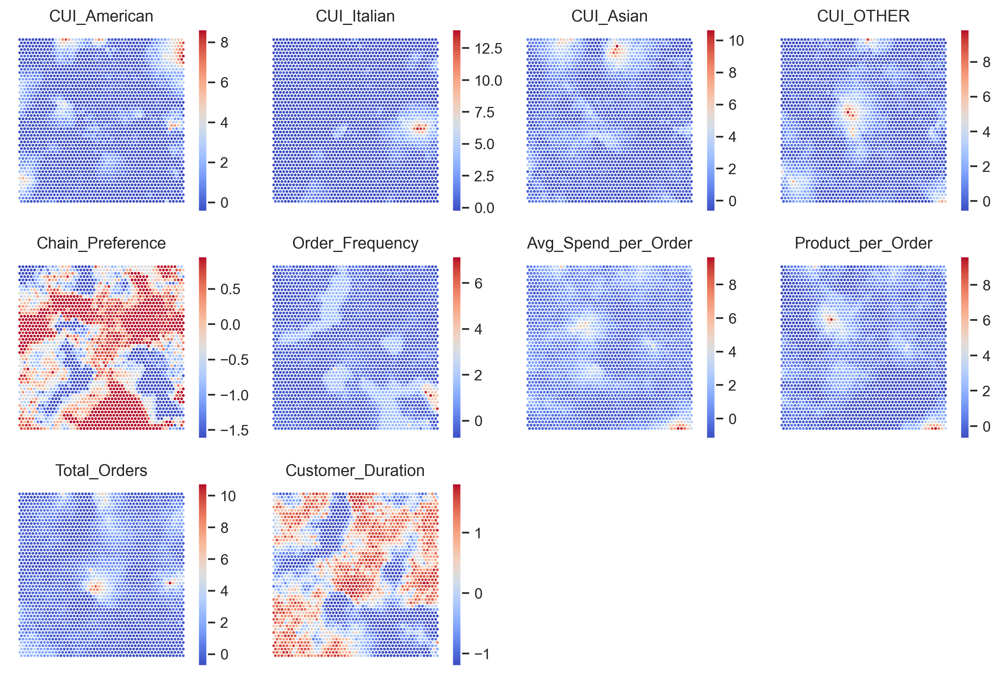

In [82]:
# Set up figure for component planes
figsize = (10, 7)
fig = plt.figure(figsize=figsize, constrained_layout=True, dpi=128)
subfigs = fig.subfigures(3, 4, wspace=0.2)

# Extract weights from som2
weights_som = sm.get_weights()

# Iterate through each feature (column) of df_behavior_standard and plot its component plane
for cpi, sf in zip(range(len(df_BEHAV.columns)), subfigs.flatten()):
    # Extract weights for the current feature (component plane) from som2's weights
    matrix_vals = weights_som[:, :, cpi]

    # Normalize the color scale for the current plane
    vext = np.max(np.abs([np.min(matrix_vals), np.max(matrix_vals)]))
    colornorm = mpl_colors.Normalize(vmin=np.min(matrix_vals), vmax=np.max(matrix_vals))
    # Alternatively, use CenteredNorm if centered color scales are desired:
    # colornorm = mpl_colors.CenteredNorm(vcenter=0, halfrange=vext)

    # Plot the hexagons for the current component plane
    sf = plot_hexagons(
        sm,                                # Trained SOM (som2)
        sf,                                  # Subfigure for the current component
        colornorm,                           # Normalization for colors
        matrix_vals,                         # Component plane values
        label=df_BEHAV.columns[cpi],  # Feature name for the title
        cmap=cm.coolwarm                     # Colormap for visualization
    )

plt.show()

#### U-Matrix (Perspective 2):

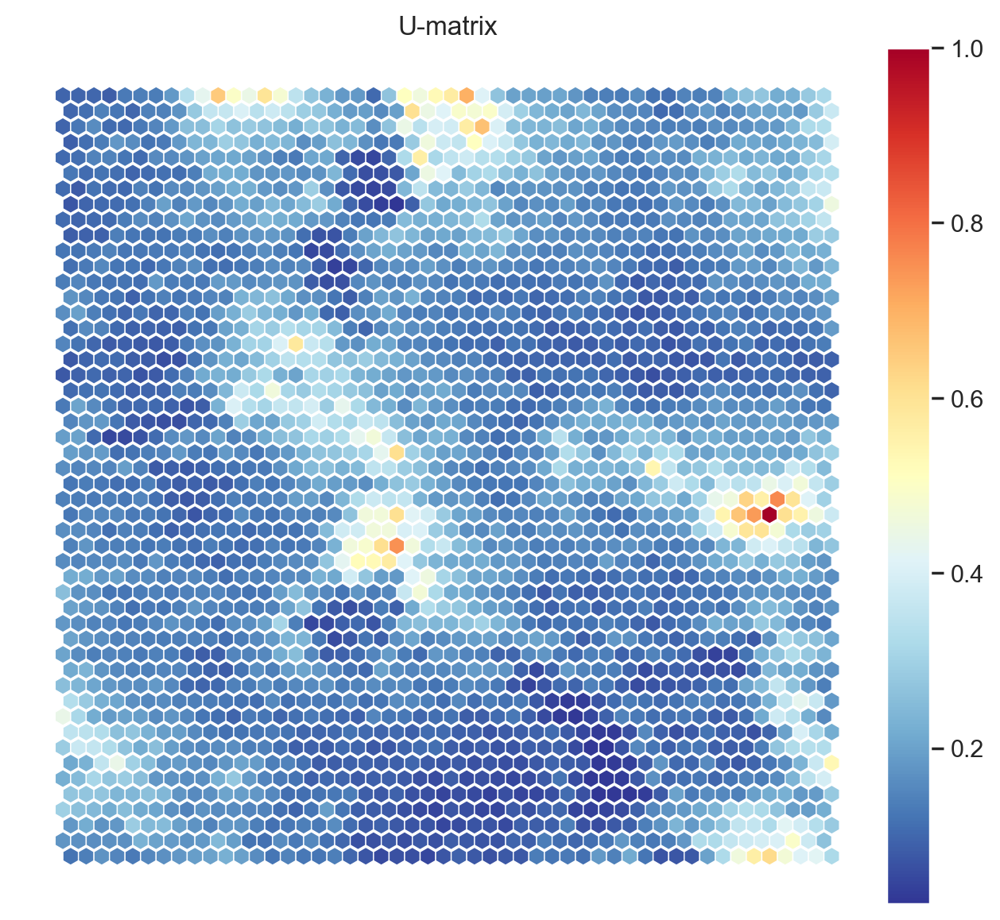

In [83]:
umatrix = sm.distance_map(scaling='mean')
fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=np.min(umatrix), vmax=np.max(umatrix))

fig = plot_hexagons(sm, fig,
                    colornorm,
                    umatrix,
                    label="U-matrix",
                    cmap=cm.RdYlBu_r,
                    annot=False
                    )

#### Hitmap (Perspective 2):

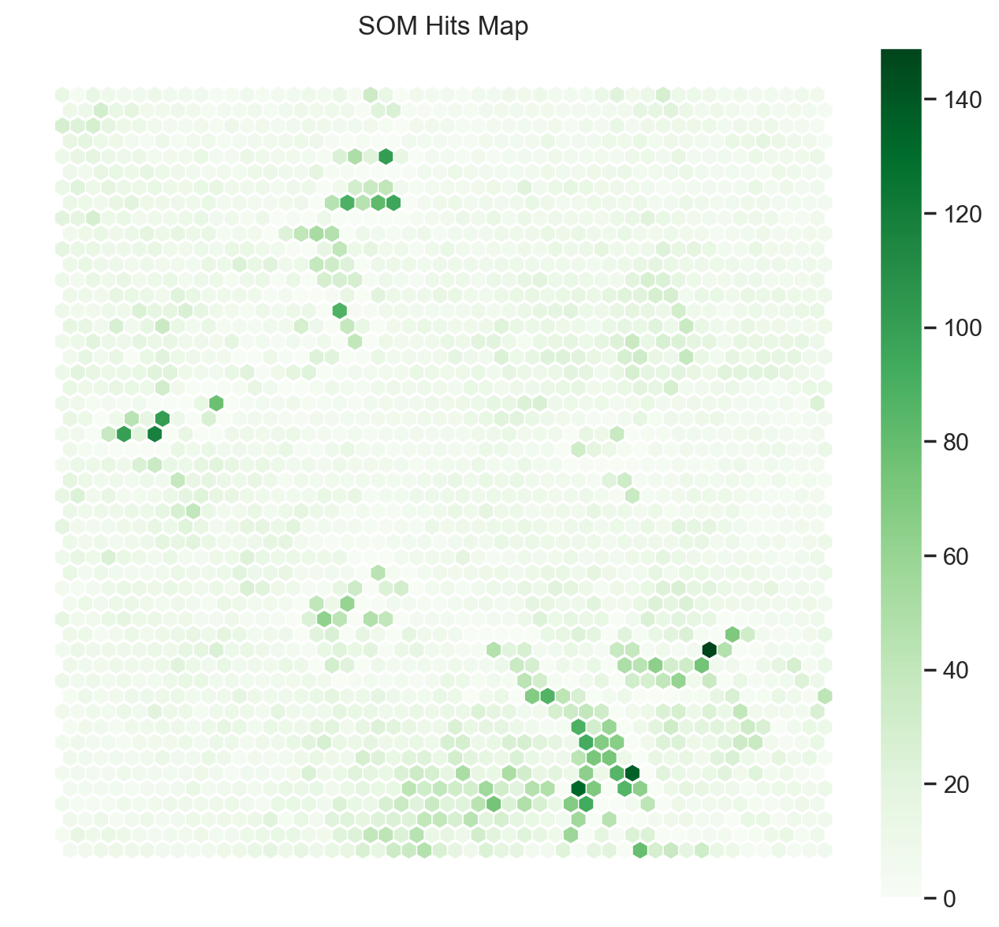

In [84]:
hitsmatrix = sm.activation_response(df_BEHAV.values)

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hitsmatrix))

fig = plot_hexagons(sm, fig,
                    colornorm,
                    hitsmatrix,
                    label="SOM Hits Map",
                    cmap=cm.Greens,
                    annot=False
                    )

#### K-Means on top of SOM units

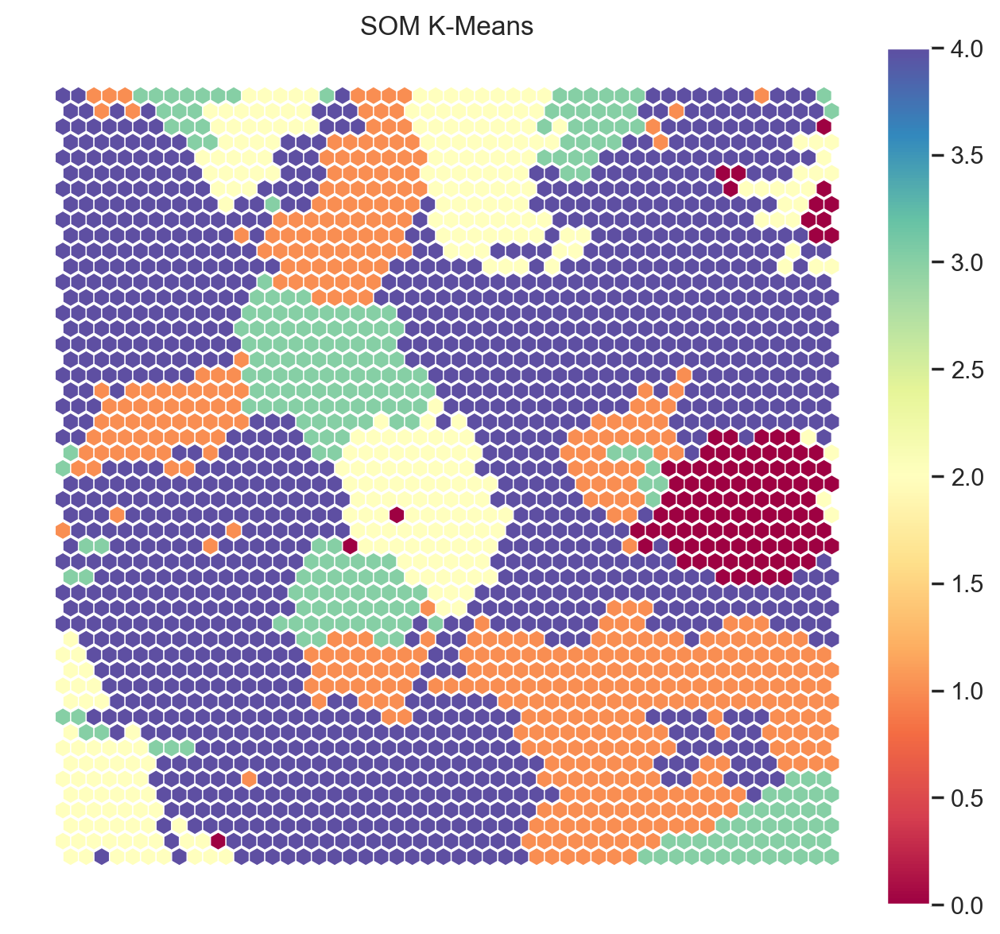

In [85]:
weights_flat = sm.get_weights().reshape((M*N),len(df_BEHAV.columns))

kmeans = KMeans(n_clusters=5, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(weights_flat)

kmeans_matrix = nodeclus_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(kmeans_matrix))

fig = plot_hexagons(sm, fig,
                    colornorm,
                    kmeans_matrix,
                    label="SOM K-Means",
                    cmap=cm.Spectral,
                    )

#### Hierarchical Clustering on top of SOM units

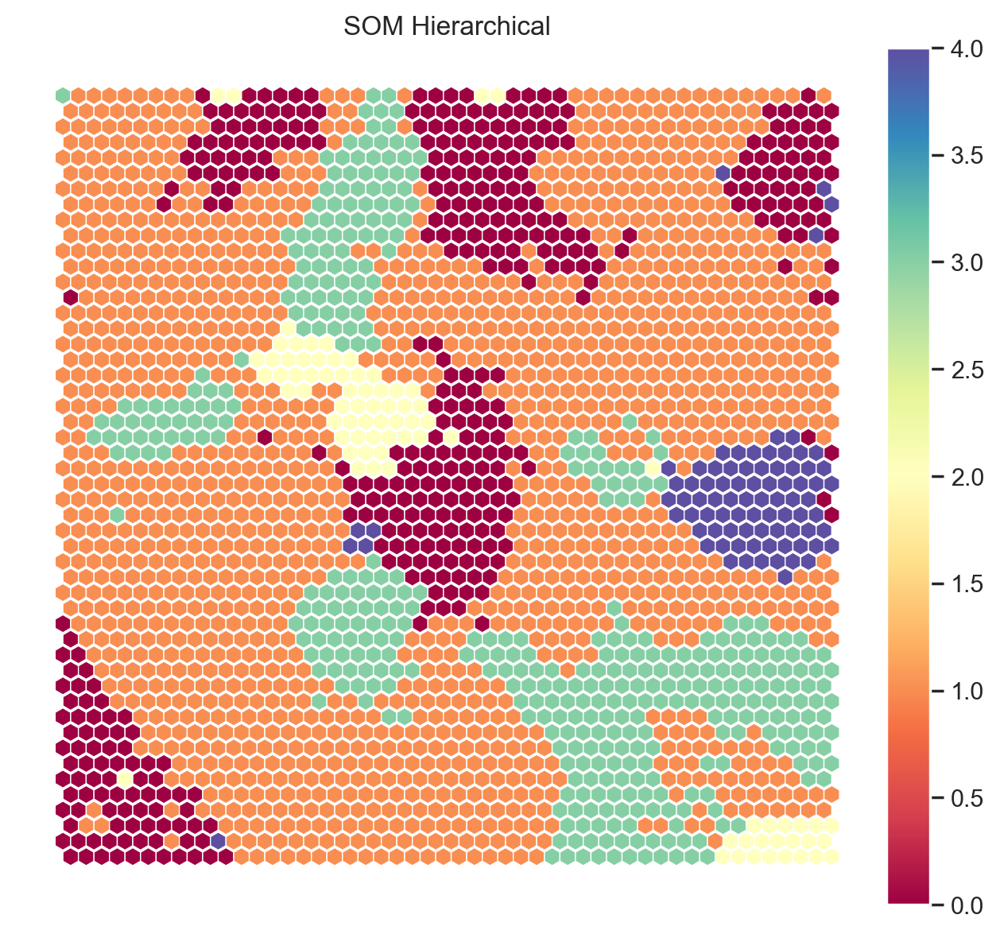

In [86]:
# Perform Hierarchical clustering on top of the MxN units

hierclust = AgglomerativeClustering(n_clusters=5, linkage='ward')
nodeclus_labels = hierclust.fit_predict(weights_flat)
hclust_matrix = nodeclus_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hclust_matrix))

fig = plot_hexagons(sm, fig,
                    colornorm,
                    hclust_matrix,
                    label="SOM Hierarchical",
                    cmap=cm.Spectral,
                    )

#### Final SOM Clustering solution - df_BEHAV

In [89]:
df_nodes = pd.DataFrame(weights_flat, columns=df_BEHAV.columns)
df_nodes['label'] = nodeclus_labels
df_nodes.head()

,CUI_American,CUI_Italian,CUI_Asian,CUI_OTHER,Chain_Preference,Order_Frequency,Avg_Spend_per_Order,Product_per_Order,Total_Orders,Customer_Duration,label
0,0.741888,0.742844,0.187068,-0.231709,0.763520,-0.378552,-0.905544,-0.358566,2.787967,1.572968,0
1,1.398308,0.807283,0.970560,-0.115169,0.618481,-0.308114,-0.701972,-0.130528,2.949813,1.355609,0
2,1.764942,-0.106236,0.282104,0.654627,0.530072,-0.329994,-0.774222,0.001798,3.092597,1.518464,0
3,2.058858,-0.048863,-0.307209,0.695278,0.870557,-0.157828,-0.983190,-0.448978,4.702876,1.658427,0
4,3.577933,-0.154005,-0.283180,0.432547,0.518009,-0.384654,-0.724812,-0.072796,2.739176,1.579171,0


In [90]:
## This gets BMU coordinates, e.g. (4,4) for each data point
bmu_index = np.array([sm.winner(x) for x in df_BEHAV.values])

som_final_labels = [hclust_matrix[i[0]][i[1]] for i in bmu_index]

df_BEHAV_som = pd.concat([
                df_BEHAV,
                pd.Series(som_final_labels, name='label', index=df_BEHAV.index)
            ], axis=1
            )

df_BEHAV_som.head()

,CUI_American,CUI_Italian,CUI_Asian,CUI_OTHER,Chain_Preference,Order_Frequency,Avg_Spend_per_Order,Product_per_Order,Total_Orders,Customer_Duration,label
customer_id,,,,,,,,,,,
1b8f824d5e,-0.456645,-0.31183,0.504971,-0.600861,-0.332317,1.560249,0.540066,2.920203,-0.507104,-1.169091,3
5d272b9dcb,0.820482,-0.31183,-0.415749,-0.600861,0.959062,1.560249,-0.080420,-0.714576,-0.507104,-1.169091,3
f6d1b2ba63,0.459858,-0.31183,-0.677350,-0.600861,0.959062,1.560249,-0.722722,-0.714576,-0.507104,-1.169091,3
180c632ed8,-0.456645,-0.31183,0.614688,-0.600861,-0.332317,0.756958,0.712031,0.497017,-0.507104,-1.134782,1
4eb37a6705,0.994817,-0.31183,0.995830,-0.600861,-1.623697,0.756958,2.244317,2.920203,-0.507104,-1.134782,2


In [91]:
# perform groupby and mean calculation
df_BEHAV_som.groupby('label').mean()

,CUI_American,CUI_Italian,CUI_Asian,CUI_OTHER,Chain_Preference,Order_Frequency,Avg_Spend_per_Order,Product_per_Order,Total_Orders,Customer_Duration
label,,,,,,,,,,
0,0.997895,-0.039330,1.346437,1.100265,0.055725,-0.438489,-0.018759,0.170515,1.804714,1.203847
1,-0.062021,-0.066501,-0.097469,-0.146352,0.076577,-0.544532,-0.191329,-0.114957,-0.096342,0.233307
2,-0.226304,-0.281995,0.428518,3.056025,-0.518603,0.382168,3.369295,3.409767,-0.031925,-0.164219
3,-0.329155,-0.193633,-0.392599,-0.358535,-0.116202,1.541521,0.236075,-0.054541,-0.686420,-1.180684
4,0.785765,5.279167,0.106744,0.131619,-0.788521,-0.444681,-0.047969,0.163528,1.746159,1.156714


#### Analysing the appropriatness

##### R²

In [92]:
sst = get_ss(df_BEHAV_som)  # get total sum of squares
ssw_labels = df_BEHAV_som.groupby('label').apply(get_ss)
# compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

0.4256642663739622

##### Quantization error

In [93]:
sm.quantization_error(som_data)

0.44175489530531975

# 4. Final clustering with merged perspectives

The technique with the highest R2 score is K-means, for both perspectives. We will use K-means for clustering and merge the results for each perspective. We will merge the lowest frequency clusters with their most similar.

* Starting K-means clustering

In [95]:
# First, apply KMeans clustering and assign behavior_labels and demographic_labels
kmeans_BEHAV = KMeans(
    n_clusters=4,  ########### change accordingly to the results
    init='k-means++',
    n_init=20,
    random_state=42
)
BEHAV_labels = kmeans_BEHAV.fit_predict(df_BEHAV)

kmeans_DEMO = KMeans(
    n_clusters=4,  ########### change accordingly to the results
    init='k-means++',
    n_init=20,
    random_state=42
)
DEMO_labels = kmeans_DEMO.fit_predict(df_DEMO)

final_df_ohc['behavior_labels'] = BEHAV_labels
final_df_ohc['demographic_labels'] = DEMO_labels

# Count label frequencies (contingency table)
pd.crosstab(final_df_ohc['behavior_labels'], final_df_ohc['demographic_labels'])

demographic_labels,0,1,2,3
behavior_labels,,,,
0,1137,1296,529,0
1,601,773,356,2005
2,5638,8728,3168,201
3,2701,2511,1140,2


#### Manual merging:

In [98]:
# Now, create centroids of clusters
metric_features = final_df_ohc.columns
df_centroids = final_df_ohc.groupby(['behavior_labels', 'demographic_labels'])[metric_features].mean()

# Manually defined clusters to merge based on low frequency (e.g., fewer than 3000 observations)
to_merge = [(0, 0), (0, 1), (0, 2), (1, 0), (1, 1), (1, 2), (1, 3), (2, 3),
            (3, 0), (3, 1), (3, 2), (3, 3)]

# Compute the Euclidean distance matrix between the centroids
euclidean = pairwise_distances(df_centroids)
df_dists = pd.DataFrame(euclidean, columns=df_centroids.index, index=df_centroids.index)

# Initialize df_manual as a copy of the final_df_ohc to apply changes
df_manual = final_df_ohc.copy()

# Add 'merged_labels' column to track the merged clusters
df_manual['merged_labels'] = df_manual.apply(
    lambda row: (int(row['behavior_labels']), int(row['demographic_labels'])),
    axis=1
)

# Apply the initial merges based on the source_target dictionary
source_target = {}

# Merging each low-frequency clustering (source) to the closest cluster (target)
for clus in to_merge:
    if clus not in source_target.values():
        source_target[clus] = df_dists.loc[clus].sort_values().index[1]  # Find the closest cluster

source_target

{(0, 0): (0, 1),
 (0, 2): (0, 1),
 (1, 0): (1, 1),
 (1, 2): (1, 1),
 (1, 3): (2, 3),
 (3, 0): (3, 1),
 (3, 2): (3, 1),
 (3, 3): (1, 3)}

In [99]:
# Change the behavior_labels and demographic_labels based on source_target
for source, target in source_target.items():
    mask = (df_manual['behavior_labels'] == source[0]) & (df_manual['demographic_labels'] == source[1])
    df_manual.loc[mask, 'behavior_labels'] = int(target[0])
    df_manual.loc[mask, 'demographic_labels'] = int(target[1])
    df_manual.loc[mask, 'merged_labels'] = pd.Series([(int(target[0]), int(target[1]))] * mask.sum(), index=df_manual[mask].index)

pd.crosstab(df_manual['merged_labels'].apply(lambda x: x[0]),
                                df_manual['merged_labels'].apply(lambda x: x[1]))

merged_labels,0,1,2,3
merged_labels,,,,
0,0,2962,0,0
1,0,1730,0,2
2,5638,8728,3168,2206
3,0,6352,0,0


Repeat the process for (0,1), (1,1), (1,3) and (2,3), which were selected has targets

In [100]:
# Define remaining clusters and clusters to merge
remaining_clusters = {(2, 0), (2, 1), (2, 2), (3,1)}
to_merge = [(0,1), (1,1), (1,3), (2,3)]

# Process each cluster in to_merge
for clus in to_merge:
    closest_cluster = df_dists.loc[clus, list(remaining_clusters)].sort_values().index[0]
    source_target[clus] = closest_cluster
    mask = (df_manual['behavior_labels'] == clus[0]) & (df_manual['demographic_labels'] == clus[1])
    df_manual.loc[mask, 'behavior_labels'] = int(closest_cluster[0])
    df_manual.loc[mask, 'demographic_labels'] = int(closest_cluster[1])
    df_manual.loc[mask, 'merged_labels'] = pd.Series([(int(closest_cluster[0]), int(closest_cluster[1]))] * mask.sum(), index=df_manual[mask].index)

# New contingency table after all merges using 'merged_labels'
pd.crosstab(df_manual['merged_labels'].apply(lambda x: x[0]),
            df_manual['merged_labels'].apply(lambda x: x[1]))


merged_labels,0,1,2
merged_labels,,,
2,5638,13420,5376
3,0,6352,0


#### Merging using Hierarchical clustering

In [101]:
# Centroids of the concatenated cluster labels
df_centroids = final_df_ohc.groupby(['behavior_labels', 'demographic_labels'])\
    [metric_features].mean()
df_centroids

Week_days_mean  Weekend_days_mean  \
behavior_labels demographic_labels                                      
0               0                        -0.753980          -0.224613   
                1                        -0.242456          -0.664646   
                2                        -0.416427          -0.505309   
1               0                         0.199767           1.414016   
                1                         1.155062           0.188377   
                2                         0.994820           0.611234   
                3                         2.618420           2.379106   
2               0                        -0.454362           0.468556   
                1                         0.102007          -0.380138   
                2                        -0.048454          -0.149052   
                3                         1.331113           1.441778   
3               0                        -0.789733          -0.380053   
                1                        -0.371661          -0.797850   
                2                        -0.533040          -0.627772   
                3                         3.040465           2.520284   

                                     HR_peak  DOW_Peak  customer_age  \
behavior_labels demographic_labels                                     
0               0                  -0.126575  1.097710     -0.309688   
                1                  -0.448365 -0.695025     -0.407577   
                2                  -0.244069 -0.053934      1.652743   
1               0                  -0.128519  1.117078     -0.295261   
                1                  -0.531582 -0.761911     -0.389319   
                2                  -0.247260 -0.232896      1.756880   
                3                   0.279844  0.030225     -0.039783   
2               0                   0.144920  1.016853     -0.297167   
                1                  -0.152164 -0.773019     -0.405018   
                2                   0.002103 -0.264547      1.642832   
                3                   0.573475  0.027604     -0.121934   
3               0                   0.330960  1.117948     -0.308901   
                1                   0.045819 -0.649262     -0.434351   
                2                   0.217729  0.069209      1.660484   
                3                   0.554425 -0.331493      0.616400   

                                    CUI_American  CUI_Italian  CUI_Asian  \
behavior_labels demographic_labels                                         
0               0                      -0.200056    -0.127833   0.149325   
                1                      -0.161731    -0.229413   0.347293   
                2                      -0.183421    -0.196125   0.249461   
1               0                       1.161792     0.577141   1.129932   
                1                       0.978420     0.121299   1.454582   
                2                       1.107631     0.222858   1.388153   
                3                       0.933030     0.871313   1.387459   
2               0                      -0.054880     0.076764  -0.166015   
                1                      -0.090145    -0.093549  -0.162690   
                2                      -0.072203    -0.022298  -0.173963   
                3                      -0.183940    -0.064046   0.046673   
3               0                      -0.285534    -0.179299  -0.483703   
                1                      -0.285959    -0.216376  -0.439368   
                2                      -0.292463    -0.197442  -0.461571   
                3                      -0.456645    -0.311830   1.130725   

                                    CUI_OTHER  Chain_Preference  \
behavior_labels demographic_labels                                
0               0                    0.308790         -0.486799   
                1                    0.621885         -0.473158   
        

In [102]:
# Using Hierarchical clustering to merge the concatenated cluster centroids
linkage = 'ward'
hclust = AgglomerativeClustering(
    linkage=linkage,
    metric='euclidean',
    distance_threshold=0,
    n_clusters=None
)
hclust_labels = hclust.fit_predict(df_centroids)

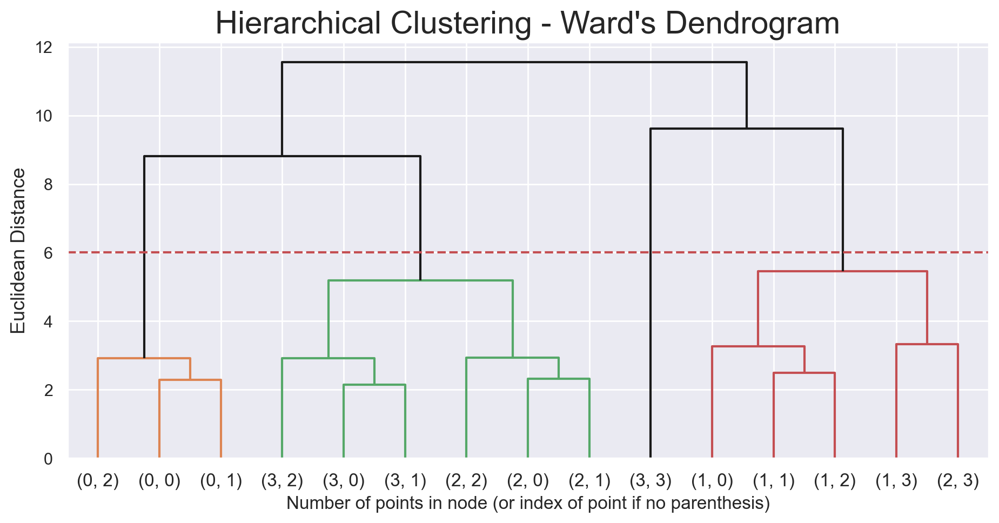

In [103]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 6
dendrogram(linkage_matrix,
           truncate_mode='level',
           labels=df_centroids.index, p=5,
           color_threshold=y_threshold,
           above_threshold_color='k')

plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [104]:
# Re-running the Hierarchical clustering based on the correct number of clusters
hclust = AgglomerativeClustering(
    linkage='ward',
    metric='euclidean',
    n_clusters= 4
)
hclust_labels = hclust.fit_predict(df_centroids)
df_centroids['hclust_labels'] = hclust_labels

df_centroids  # centroid's cluster labels

Week_days_mean  Weekend_days_mean  \
behavior_labels demographic_labels                                      
0               0                        -0.753980          -0.224613   
                1                        -0.242456          -0.664646   
                2                        -0.416427          -0.505309   
1               0                         0.199767           1.414016   
                1                         1.155062           0.188377   
                2                         0.994820           0.611234   
                3                         2.618420           2.379106   
2               0                        -0.454362           0.468556   
                1                         0.102007          -0.380138   
                2                        -0.048454          -0.149052   
                3                         1.331113           1.441778   
3               0                        -0.789733          -0.380053   
                1                        -0.371661          -0.797850   
                2                        -0.533040          -0.627772   
                3                         3.040465           2.520284   

                                     HR_peak  DOW_Peak  customer_age  \
behavior_labels demographic_labels                                     
0               0                  -0.126575  1.097710     -0.309688   
                1                  -0.448365 -0.695025     -0.407577   
                2                  -0.244069 -0.053934      1.652743   
1               0                  -0.128519  1.117078     -0.295261   
                1                  -0.531582 -0.761911     -0.389319   
                2                  -0.247260 -0.232896      1.756880   
                3                   0.279844  0.030225     -0.039783   
2               0                   0.144920  1.016853     -0.297167   
                1                  -0.152164 -0.773019     -0.405018   
                2                   0.002103 -0.264547      1.642832   
                3                   0.573475  0.027604     -0.121934   
3               0                   0.330960  1.117948     -0.308901   
                1                   0.045819 -0.649262     -0.434351   
                2                   0.217729  0.069209      1.660484   
                3                   0.554425 -0.331493      0.616400   

                                    CUI_American  CUI_Italian  CUI_Asian  \
behavior_labels demographic_labels                                         
0               0                      -0.200056    -0.127833   0.149325   
                1                      -0.161731    -0.229413   0.347293   
                2                      -0.183421    -0.196125   0.249461   
1               0                       1.161792     0.577141   1.129932   
                1                       0.978420     0.121299   1.454582   
                2                       1.107631     0.222858   1.388153   
                3                       0.933030     0.871313   1.387459   
2               0                      -0.054880     0.076764  -0.166015   
                1                      -0.090145    -0.093549  -0.162690   
                2                      -0.072203    -0.022298  -0.173963   
                3                      -0.183940    -0.064046   0.046673   
3               0                      -0.285534    -0.179299  -0.483703   
                1                      -0.285959    -0.216376  -0.439368   
                2                      -0.292463    -0.197442  -0.461571   
                3                      -0.456645    -0.311830   1.130725   

                                    CUI_OTHER  Chain_Preference  \
behavior_labels demographic_labels                                
0               0                    0.308790         -0.486799   
                1                    0.621885         -0.473158   
        

In [105]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids['hclust_labels'].to_dict()

df_hie = final_df_ohc.copy()

# Mapping the hierarchical clusters on the centroids to the observations
df_hie['merged_labels'] = df_hie.apply(
    lambda row: cluster_mapper[
        (row['behavior_labels'], row['demographic_labels'])
    ], axis=1
)

# Merged cluster centroids
df_hie.groupby('merged_labels').mean()[metric_features]

,Week_days_mean,Weekend_days_mean,HR_peak,DOW_Peak,customer_age,CUI_American,CUI_Italian,CUI_Asian,CUI_OTHER,Chain_Preference,Order_Frequency,Avg_Spend_per_Order,Product_per_Order,Total_Orders,Customer_Duration,behavior_labels,demographic_labels
merged_labels,,,,,,,,,,,,,,,,,
0,1.749127,1.593736,0.025452,0.016678,0.010869,0.935626,0.572681,1.292912,1.109014,-0.044393,-0.427414,-0.055770,0.165707,1.942432,1.252294,1.051067,2.058689
1,-0.230213,-0.204886,0.031517,-0.016068,-0.001590,-0.131777,-0.071466,-0.244620,-0.242597,0.067061,-0.016242,-0.257858,-0.288789,-0.253135,-0.113371,2.265930,0.831240
2,3.040465,2.520284,0.554425,-0.331493,0.616400,-0.456645,-0.311830,1.130725,1.614822,0.555506,5.347192,-0.716442,0.163829,3.247234,-0.997544,3.000000,3.000000
3,-0.469881,-0.467277,-0.288356,0.107634,-0.002037,-0.180316,-0.184475,0.253828,0.481554,-0.482174,0.695326,2.153996,2.108529,-0.542040,-0.749177,0.000000,0.794733


In [106]:
# Merge cluster contigency table
# Getting size of each final cluster
df_counts = df_hie.groupby('merged_labels')\
    .size()\
    .to_frame()

# Getting the product and behavior labels
df_counts = df_counts\
    .rename({v:k for k, v in cluster_mapper.items()})\
    .reset_index()

df_counts['behavior_labels'] = df_counts['merged_labels'].apply(lambda x: x[0])
df_counts['demographic_labels'] = df_counts['merged_labels'].apply(lambda x: x[1])

# Create pivot table and replace NaN with 0
df_counts_pivot = df_counts.pivot(values=0, index='behavior_labels', columns='demographic_labels')\
    .fillna(0)
df_counts_pivot

demographic_labels,2,3
behavior_labels,,
0,2962.0,0.0
2,0.0,3936.0
3,23886.0,2.0


We opted to select manual clustering for our merging approach, since it offers more control over the process of forming clustering. Contrarily to hierarchical clustering, that uses distance-based algorithms, by merging manually the cluster we can better control the formation of imbalanced clusters. This approach ensures that the final groupings better align with real-world needs.

### Updating cluster labels on manual merge

In [109]:
df_manual["merged_labels"].unique()

array([(2, 1), (3, 1), (2, 2), (2, 0)], dtype=object)

In [110]:
df_manual["behavior_labels"].replace({2:0, 3:1}, inplace=True)
#df_manual["demographic_labels"].replace({1:0, 2:1, 3: 2}, inplace=True)

# Define the replacement dictionary
replacement_dict = {(2, 1):0, (3, 1):1, (2, 2):2, (2, 0):3}

# Replace tuples using apply
df_manual["merged_labels"] = df_manual["merged_labels"].apply(lambda x: replacement_dict.get(x, x))

#### Cluster Analysis

* Profiling with the manual merge:

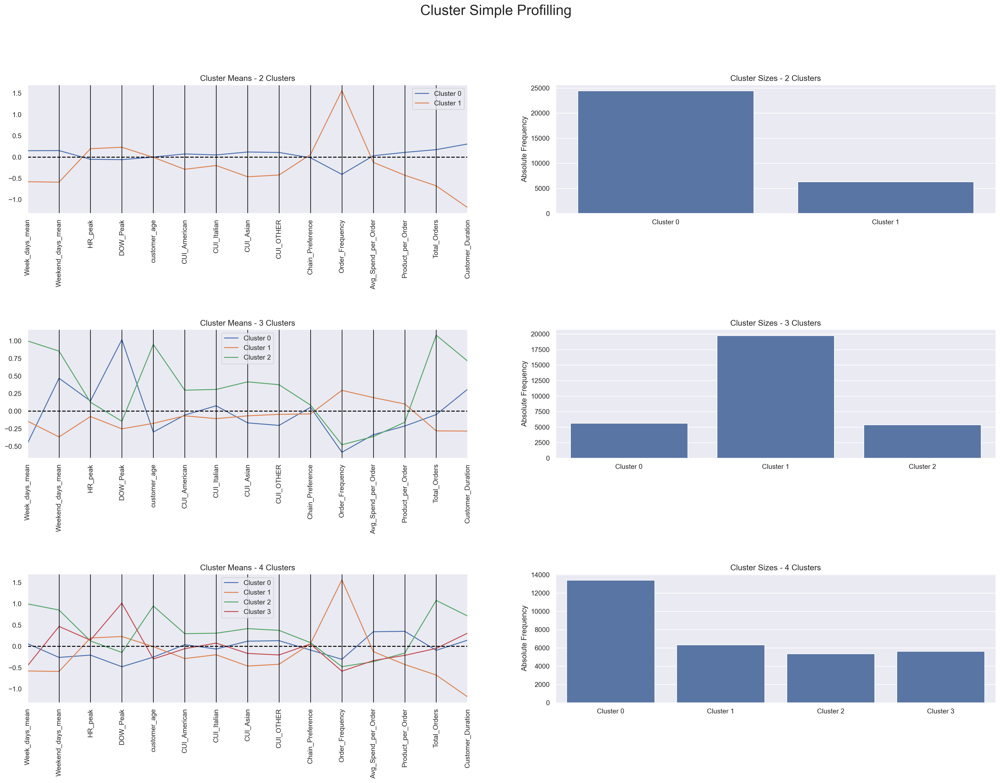

In [111]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(28, 18), squeeze=False)

for ax, label in zip(axes, ['behavior_labels', 'demographic_labels', 'merged_labels']):
    # Filtering df
    drop_cols = [i for i in ['behavior_labels', 'demographic_labels', 'merged_labels'] if i!=label]
    dfax = df_manual.drop(drop_cols, axis=1)

    # Getting the cluster centroids and counts
    centroids = dfax.groupby(by=label, as_index=False).mean()
    counts = dfax.groupby(by=label, as_index=False).count().iloc[:, [0, 1]]
    counts.columns = [label, "counts"]

    # Setting Data
    pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
    sns.barplot(x=counts[label].unique().tolist(), y="counts", data=counts, ax=ax[1])


    #Setting Layout
    handles, _ = ax[0].get_legend_handles_labels()
    cluster_labels = ["Cluster {}".format(i) for i in counts[label].unique().tolist()]
    ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters

    ax[0].axhline(color="black", linestyle="--")
    ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
    ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90)
    ax[1].set_xticklabels(cluster_labels)
    ax[1].set_xlabel("")
    ax[1].set_ylabel("Absolute Frequency")
    ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)


plt.subplots_adjust(hspace=0.90, top=0.88)
plt.suptitle("Cluster Simple Profilling", fontsize=23)
plt.show()

#### Updating the final dataset

In [112]:
# Setting df to have the final product, behavior and merged clusters of manual clustering
final_df_ohc = df_manual.copy()

# 5. Profiling with RFM

In [113]:
final_df_ohc = pd.concat([final_df_ohc, df_RFM.drop(columns=["R", "F", "M"])], axis=1)

final_df_ohc.head()

,Week_days_mean,Weekend_days_mean,HR_peak,DOW_Peak,customer_age,CUI_American,CUI_Italian,CUI_Asian,CUI_OTHER,Chain_Preference,...,behavior_labels,demographic_labels,merged_labels,Recency,Frequency,Monetary,RFM_Group,RFM_Score,RFM_Segment,RFM_Vgroup
customer_id,,,,,,,,,,,,,,,,,,,,,
1b8f824d5e,-0.444861,-0.430645,1.208156,-1.320239,-1.446986,-0.456645,-0.31183,0.504971,-0.600861,-0.332317,...,0,1,0,1,2,28.88,1-1-3,5,Mid-Value,At Risk
5d272b9dcb,-0.444861,-0.430645,-0.286086,-1.320239,-1.605708,0.820482,-0.31183,-0.415749,-0.600861,0.959062,...,1,1,1,1,2,19.21,1-1-2,4,Low-Value,Almost Lost
f6d1b2ba63,-0.444861,-0.430645,-0.472866,-1.320239,1.727454,0.459858,-0.31183,-0.677350,-0.600861,0.959062,...,1,1,1,1,2,9.20,1-1-1,3,Low-Value,Lost
180c632ed8,-0.444861,-0.430645,-0.099305,-0.825866,-0.177210,-0.456645,-0.31183,0.614688,-0.600861,-0.332317,...,1,1,1,2,2,31.56,1-1-3,5,Mid-Value,At Risk
4eb37a6705,-0.444861,-0.430645,-0.659646,-0.825866,-1.129542,0.994817,-0.31183,0.995830,-0.600861,-1.623697,...,0,1,0,2,2,55.44,1-1-4,6,Mid-Value,At Risk


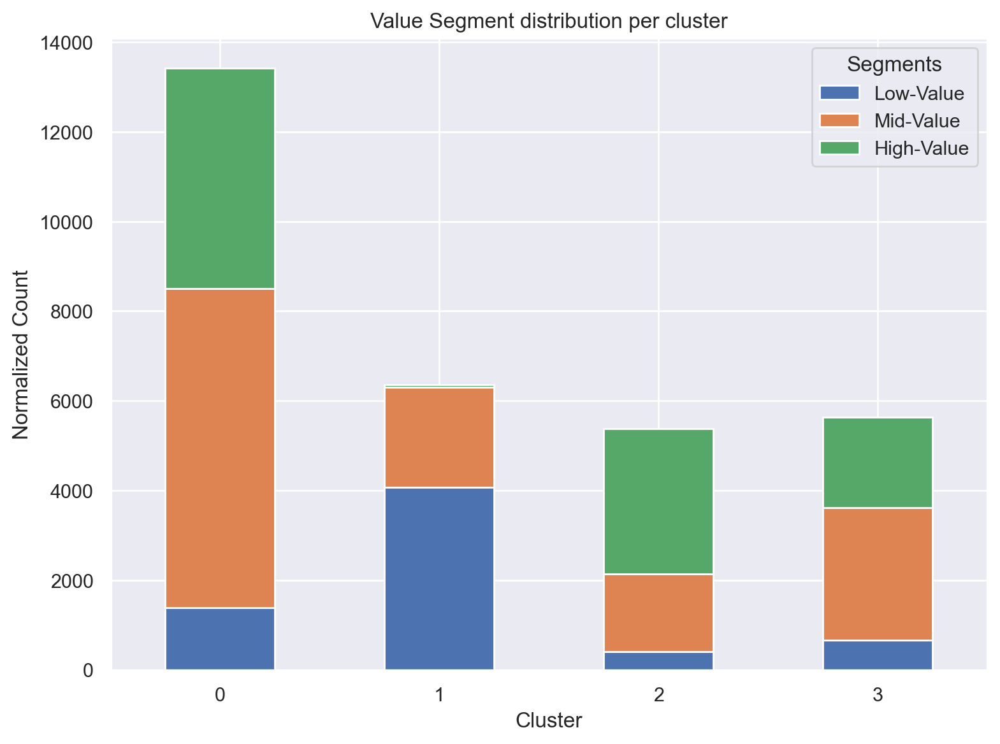

In [114]:
# Group by 'merged_labels' and 'RFM_Segment', calculate normalized counts
segment_distribution = final_df_ohc.groupby(['merged_labels'])["RFM_Segment"].value_counts().reset_index(name="count")

# Create a dictionary to map RFM_Segment values to their order
segment_order = {'Low-Value': 0, 'Mid-Value': 1, 'High-Value': 2}  # Adjust if order is different

# Pivot table with fill value and custom column order
segment_distribution = segment_distribution.pivot_table(
    index='merged_labels', columns='RFM_Segment', values='count', fill_value=0
)

segment_distribution = segment_distribution[["Low-Value", "Mid-Value", "High-Value"]]

# Plotting
segment_distribution.plot(kind='bar', stacked=True, figsize=(8, 6))

plt.title('Value Segment distribution per cluster')
plt.xlabel('Cluster')
plt.ylabel('Normalized Count')
plt.xticks(rotation=0)  # Keep x-axis labels horizontal
plt.legend(title='Segments')
plt.tight_layout()

plt.show()

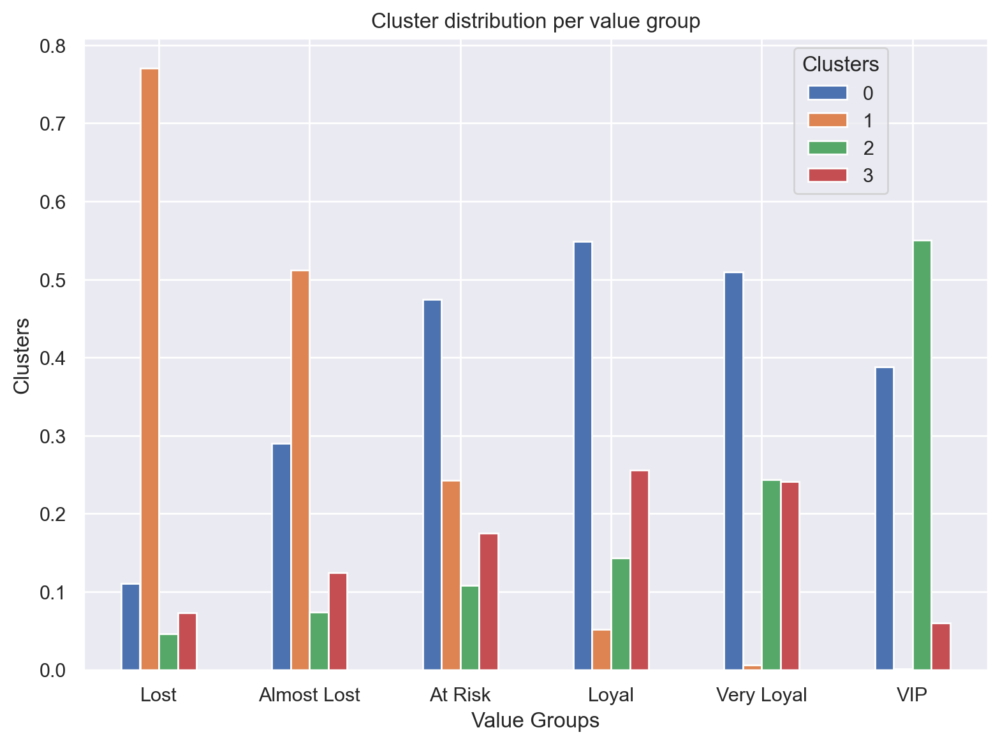

In [115]:
vgroup_order = {"Lost":0, "Almost Lost":1, "At Risk":2, "Loyal":4, "Very Loyal":5, "VIP":6}

# Group by 'merged_labels' and 'RFM_Segment' and calculate the normalized counts
cluster_distribution_pvg = final_df_ohc.groupby(['RFM_Vgroup'])["merged_labels"].value_counts(normalize=True).reset_index(name="freq")

cluster_distribution_pvg = cluster_distribution_pvg.pivot_table(index='RFM_Vgroup', columns='merged_labels', values='freq', fill_value=0)

cluster_distribution_pvg = cluster_distribution_pvg.reindex(vgroup_order)

# Plotting
cluster_distribution_pvg.plot(kind='bar', figsize=(8, 6))  # figsize for better visualization

plt.title('Cluster distribution per value group')
plt.xlabel('Value Groups')
plt.ylabel('Clusters')
plt.xticks(rotation=0)  # Keep x-axis labels horizontal
plt.legend(title='Clusters', loc='upper right', bbox_to_anchor=(0.9, 1))  # Adjust x-offset for better positioning
plt.tight_layout() # Adjusts layout to prevent labels from overlapping
plt.show()